In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import random
import tensorflow as tf
from models_modify import *
from data_loader import *
from error_functions import *
import datetime
from keras.callbacks import EarlyStopping
from keras.utils import multi_gpu_model
import time
tf.__version__

'2.2.0'

In [2]:
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="1"
# from keras.backend.tensorflow_backend import set_session
# config = tf.ConfigProto()
# config.gpu_options.allocator_type = 'BFC' #A "Best-fit with coalescing" algorithm, simplified from a version of dlmalloc.
# config.gpu_options.per_process_gpu_memory_fraction = 0.9
# config.gpu_options.allow_growth = True
# set_session(tf.Session(config=config))

In [3]:
opt = {}

# opt['train_path'] = '/home/sylar/data/phantom'
# opt['train_img1_path'] = ['/mask/msk','/mask1/msk','/mask2/msk']
# opt['train_img2_path'] = ['/phs_total/phs','/phs_total1/phs','/phs_total2/phs']
# opt['train_label_path'] = ['/qsm/qsm','/qsm1/qsm','/qsm2/qsm']

# opt['train_path'] = '/home/sylar/data/'
# opt['train_img1_path'] = ['phantom/mask/msk','dp_inv_simu_train/simu_new_dipole/simu32_111/mask/msk']
# opt['train_img2_path'] = ['phantom/phs_total/phs','dp_inv_simu_train/simu_new_dipole/simu32_111/phs/phs']
# opt['train_label_path'] = ['phantom/qsm/qsm','dp_inv_simu_train/simu_new_dipole/simu32_111/qsm/qsm']

opt['train_path'] = '/home/sylar/data/'
opt['train_img1_path'] = ['phantom/patch64/mask/msk','simu_shape/patch2_alter_64/mask/msk']
opt['train_img2_path'] = ['phantom/patch64/phs_total/phs','simu_shape/patch2_alter_64/phs/phs']
opt['train_label_path'] = ['phantom/patch64/qsm/qsm','simu_shape/patch2_alter_64/qsm/qsm']

# opt['val_path'] = '/media/hd1/sylar/data/patch_shape_simu'
# opt['val_img1_path'] = '/phs_tissue/phs'
# opt['val_img2_path'] = '/phs_tissue/phs'
# opt['val_label_path'] = '/qsm/qsm'

# opt['train_path'] = '/home/sylar/data/invivo/PD/ss_p2q'
# opt['train_img1_path'] = ['/mask/msk']
# opt['train_img2_path'] = ['/phs_total/phs']
# opt['train_label_path'] = ['/qsm/qsm']

opt['reso'] = (1,1,1)
# opt['reso'] = (0.45,0.45,1.0)

opt['rad'] = [5,3]
opt['ker'] = []
for n in range(len(opt['rad'])):
    nx,ny,nz=round(opt['rad'][n]/opt['reso'][0]),round(opt['rad'][n]/opt['reso'][1]),round(opt['rad'][n]/opt['reso'][2])
    nx,ny,nz = max(nx,2),max(ny,2),max(nz,2)
    ky,kx,kz = np.mgrid[-nx:nx+1,-ny:ny+1,-nz:nz+1]
    k = (kx**2/nx**2+ky**2/ny**2+kz**2/nz**2<=1)
    a = k/np.sum(k)
    opt['ker'].append(a)

# opt['patch_size'] = (48,48,48)
opt['patch_size'] = (80,80,80)
#opt['patch_size'] = (32,32,32)

# opt['ker'],opt['del_ker'] = smv(opt)

opt['lbd'] = 0.1
opt['iter'] = 1
opt['batch_size'] = 30
opt['channels'] = 3
opt['img_shape'] = opt['patch_size'] + (opt['channels'],)
opt['in_shape'] = opt['patch_size'] + (1,)
opt['is_batch'] = True
opt['is_aug'] = True

opt['model_restored'] = True
opt['model_restored_epoch'] = 2  # from 23 change random combine
opt['model_total_epoch'] = 100
opt['model_save_interval'] = 1

opt['learning_rate'] = 2e-5
opt['beta_1'] = 0.9
opt['beta_2'] = 0.99

opt['loss'] = nrmse

opt['display_nums'] = [10,20,30]

opt['model_save_path'] = '/home/sylar/data/results/keras/ss_at2_8_shape_phan_vs_iter1'
opt['checkpoint_path'] = opt['model_save_path']+"/cp{epoch}"

In [4]:
if opt['model_restored'] == False:
    index = list(range(1,22001))
    random.shuffle(index)
    opt['train_index'] = index[0:21800]
    opt['val_index'] = index[21800:22000]
    np.save(opt['model_save_path'] + '/train_index8.npy', opt['train_index'])
    np.save(opt['model_save_path'] + '/val_index2.npy', opt['val_index'])
else:
    opt['train_index'] = np.load(opt['model_save_path']+'/train_index8.npy')
    opt['val_index'] = np.load(opt['model_save_path']+'/val_index2.npy')

In [5]:
opt['train_data'] = Data_loaders(opt)
x1_train, x2_train, y_train = opt['train_data'].next([1],opt)

# opt['val_data'] = Data_loaders(opt['val_path'], opt['val_img1_path'], opt['val_img2_path'], opt['val_label_path'], opt['val_index'], opt['patch_size'], opt['batch_num'])
# x1_val, x2_val, y_val = opt['val_data'].next(opt['is_patch'], rand_flip=opt['is_random_flip'])
print(opt['train_data'].data_size)

43600


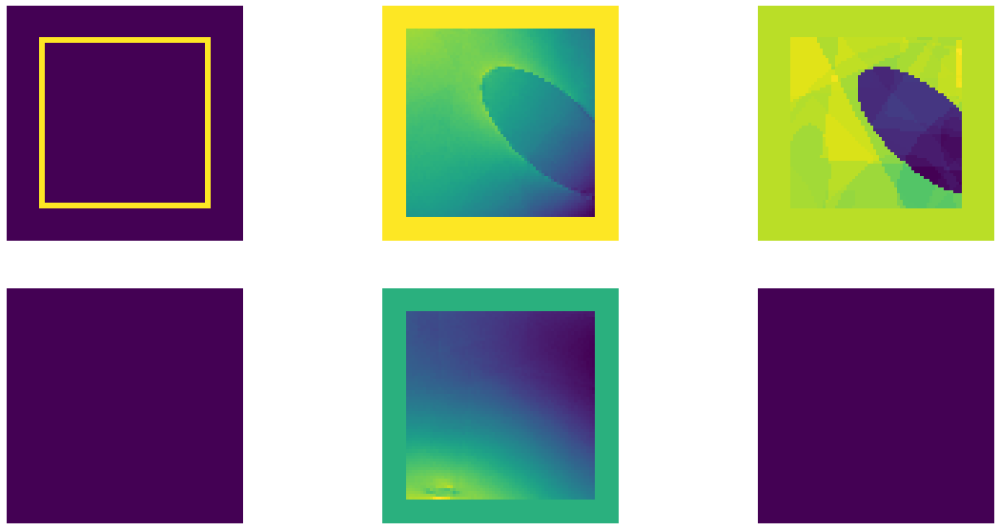

In [6]:
'''loading data preshow'''
ch,cw,cd = findcenter3d(y_train[0])
aa=cw
dd=cd

f, axarr = plt.subplots(2, 3, figsize=(20, 10))
axarr[1,0].imshow(np.flip(np.transpose(x1_train[0,:,aa,:,1].squeeze()),0))
axarr[1,0].axis('off')
axarr[0,2].imshow(np.transpose(y_train[0,:,:,dd].squeeze()))
axarr[0,2].axis('off')
axarr[0,0].imshow(np.transpose(x1_train[0,:,:,dd,1].squeeze()))
axarr[0,0].axis('off')
axarr[1,1].imshow(np.flip(np.transpose(x2_train[0,:,aa,:].squeeze()),0))
axarr[1,1].axis('off')
axarr[1,2].imshow(np.flip(np.transpose(y_train[0,:,aa,:].squeeze()),0))
axarr[1,2].axis('off')
axarr[0,1].imshow(np.transpose(x2_train[0,:,:,dd].squeeze()))
axarr[0,1].axis('off')
plt.show()

In [7]:
tf.compat.v1.disable_eager_execution()
model = {}

model['vnet'] = unet_at1_func(opt, 1)
x = Input(shape=opt['img_shape'])

# lbd = 0.1
x_k = tf.zeros_like(x[...,1:2])
for _ in range(5):
    x_k = x_k - (grad_phs2dip(x[...,0:2],x_k,x[...,2:3],opt) + opt['lbd']*(x_k))

x_k = x_k * (x[...,0:1]+x[...,1:2])
for it in range(opt['iter']):
    net_out = model['vnet'](x_k)
    x_k = x_k - (grad_phs2dip(x[...,0:2],x_k,x[...,2:3],opt) + opt['lbd']*(x_k-net_out))

# L = tf.zeros_like(x[...,1:2])
# for _ in range(5):
#     L = L - (grad3_phs(x[...,0:len(opt['rad'])],L,x[...,len(opt['rad']):len(opt['rad'])+1],opt) + opt['lbd']*L)
# L = L * (x[...,0:1]+x[...,1:2])
# #updata x_k, qsm
# x_k = phase2qsm(L,opt)

# for it in range(opt['iter']):
#     net_out = model['vnet'](x_k)

#     Lref = qsm2phase(x_k,opt)
#     L = tf.zeros_like(x[...,1:2])
#     for _ in range(5):
#         L = L - (grad3_phs(x[...,0:len(opt['rad'])],L,x[...,len(opt['rad']):len(opt['rad'])+1],opt) + opt['lbd']*(L-Lref))
#     #updata x_k, qsm
#     x_k = phase2qsm(L,opt) + opt['lbd']*phaseinv(net_out,opt)

model['optimizer'] = Adam(opt['learning_rate'], opt['beta_1'], opt['beta_2'])

model['combine'] = Model(inputs = x,
                     outputs = [net_out, x_k],
                     name='combine_model')

model['combine'].compile(optimizer = model['optimizer'],
                     loss = [opt['loss'],opt['loss']],
                     loss_weights = [0.5, 0.5],
                     metrics=['accuracy'])

# Create a callback that saves the model's weights
if opt['model_restored'] == True:
    model['vnet'].load_weights(opt['checkpoint_path'].format(epoch = opt['model_restored_epoch']))
    start_epoch = opt['model_restored_epoch']
else:
    start_epoch = 1

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Start Time:1628474378.0016446
-----Start Training-----
[Epoch 2/100] [Batch 1/43600] [Model loss: 4.579343-1.013289-8.145396 ; nrmse: 1.006678]


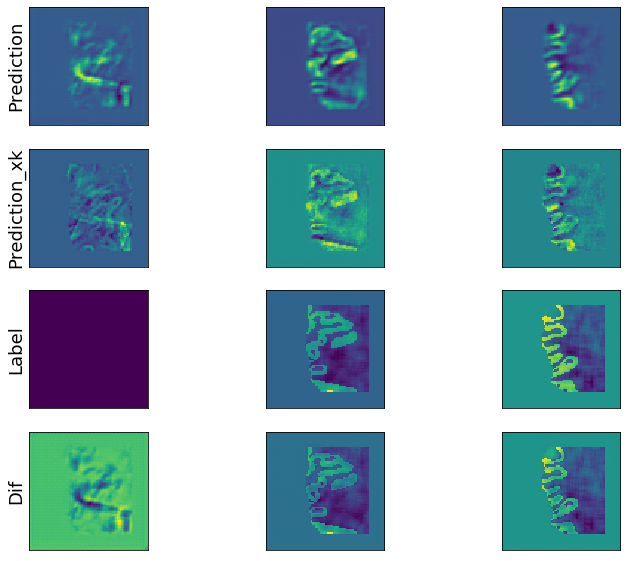

[Epoch 2/100] [Batch 901/43600] [Model loss: 2.243748-0.868272-3.619223 ; nrmse: 0.867745]


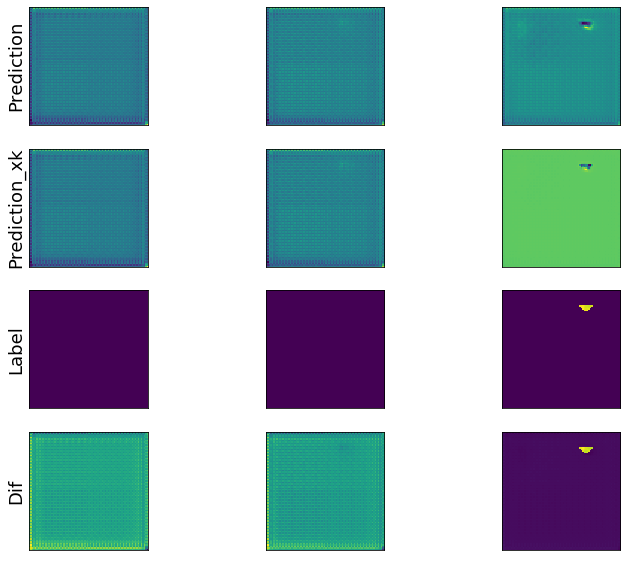

[Epoch 2/100] [Batch 1801/43600] [Model loss: 2.254702-0.838121-3.671283 ; nrmse: 0.837476]


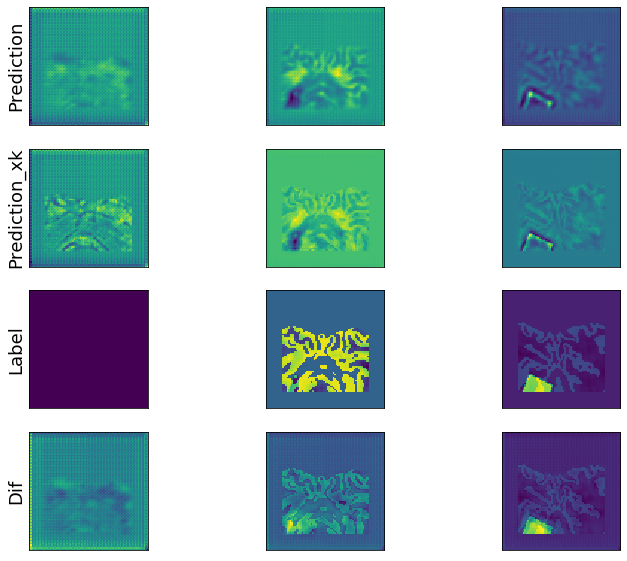

[Epoch 2/100] [Batch 2701/43600] [Model loss: 2.369820-0.920598-3.819043 ; nrmse: 0.918061]


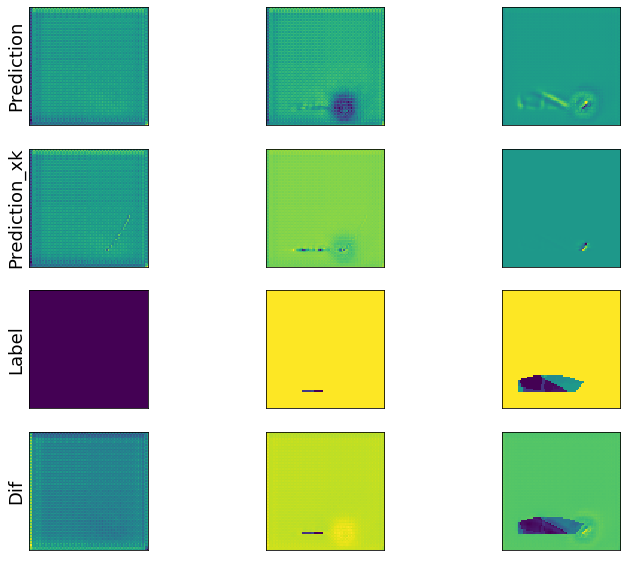

[Epoch 2/100] [Batch 3601/43600] [Model loss: 3.739081-0.908699-6.569462 ; nrmse: 0.908742]


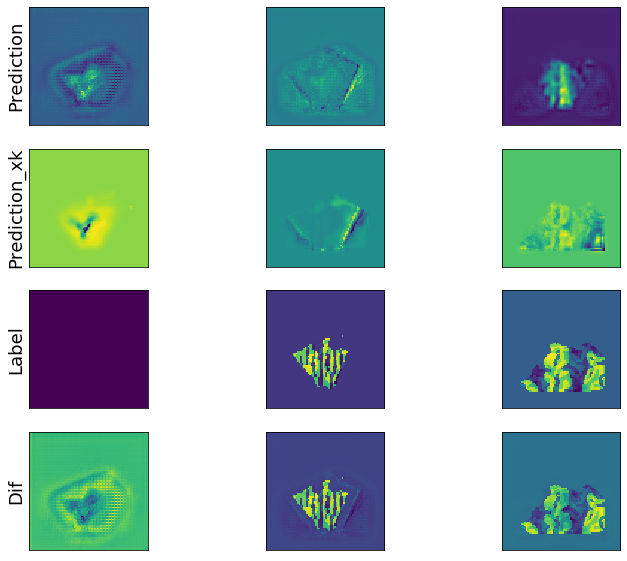

[Epoch 2/100] [Batch 4501/43600] [Model loss: 1.160101-0.840728-1.479474 ; nrmse: 0.836819]


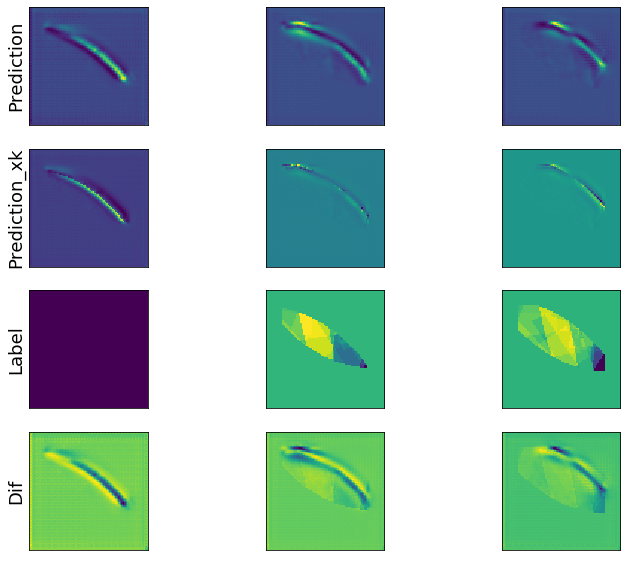

[Epoch 2/100] [Batch 5401/43600] [Model loss: 3.247590-0.893353-5.601826 ; nrmse: 0.889502]


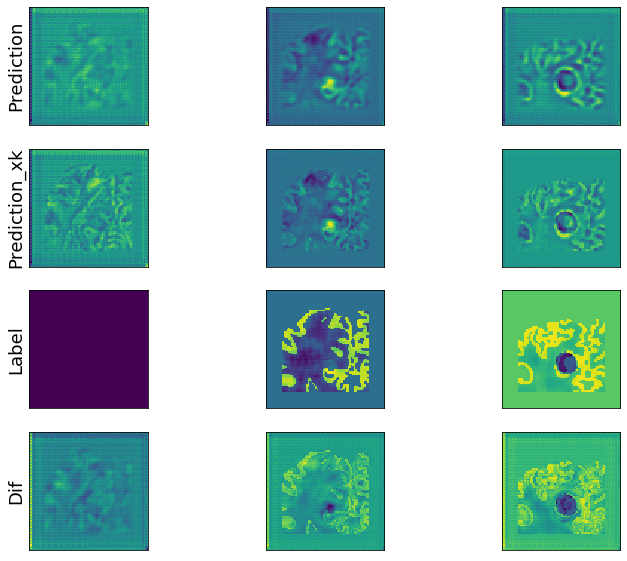

[Epoch 2/100] [Batch 6301/43600] [Model loss: 4.727916-0.904288-8.551545 ; nrmse: 0.904000]


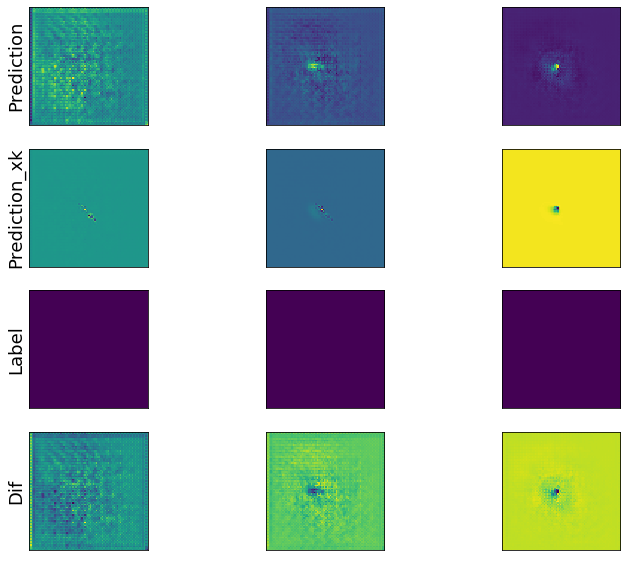

[Epoch 2/100] [Batch 7201/43600] [Model loss: 1.759891-0.885760-2.634021 ; nrmse: 0.883967]


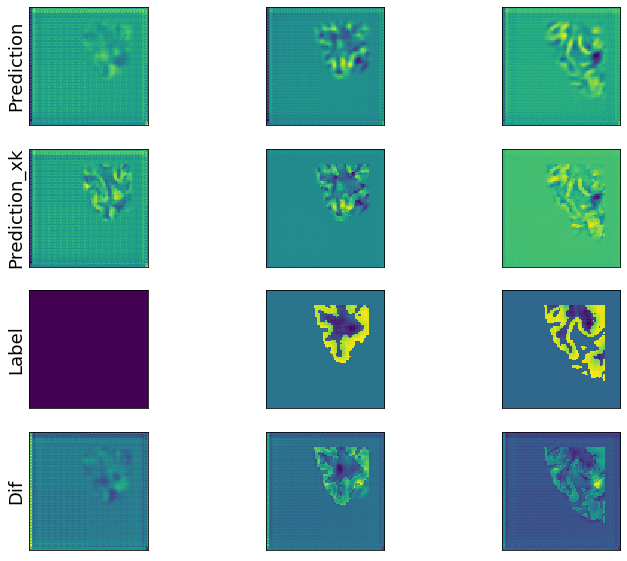

[Epoch 2/100] [Batch 8101/43600] [Model loss: 2.555120-0.902330-4.207910 ; nrmse: 0.901365]


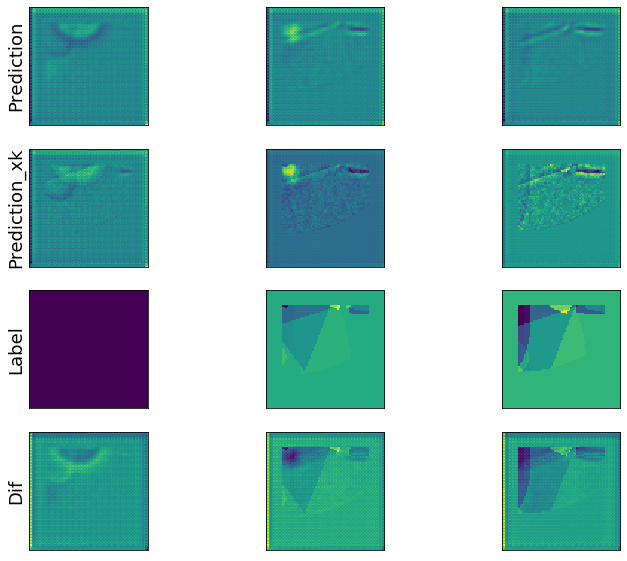

[Epoch 2/100] [Batch 9001/43600] [Model loss: 5.841280-0.858748-10.823812 ; nrmse: 0.858849]


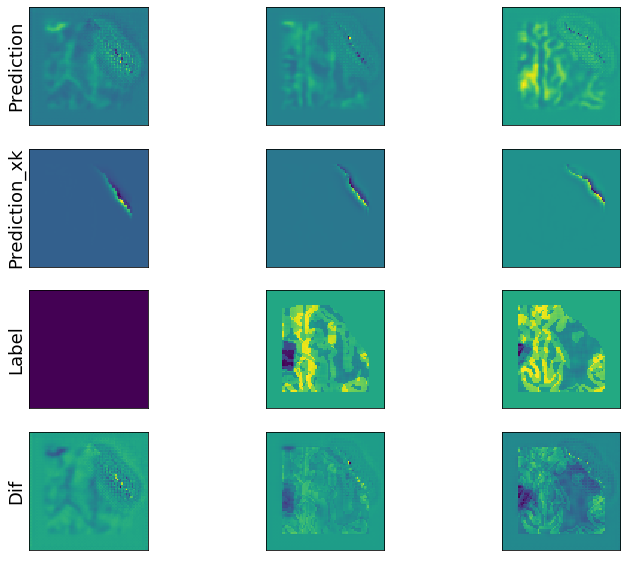

[Epoch 2/100] [Batch 9901/43600] [Model loss: 1.833816-0.899187-2.768445 ; nrmse: 0.898528]


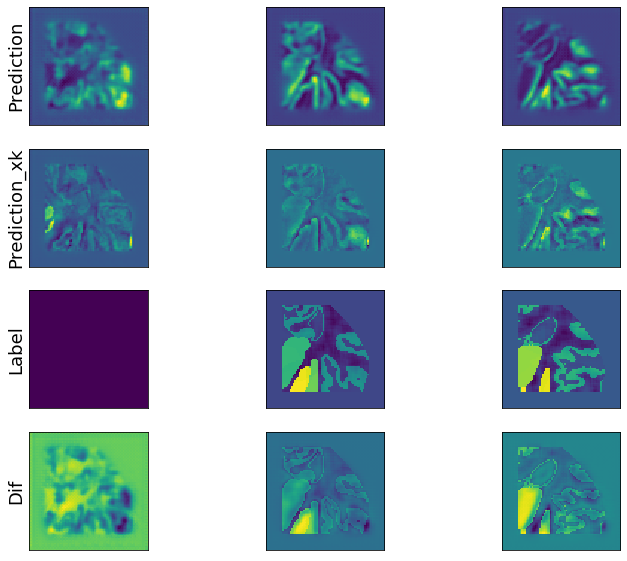

[Epoch 2/100] [Batch 10801/43600] [Model loss: 2.455965-0.856578-4.055351 ; nrmse: 0.856650]


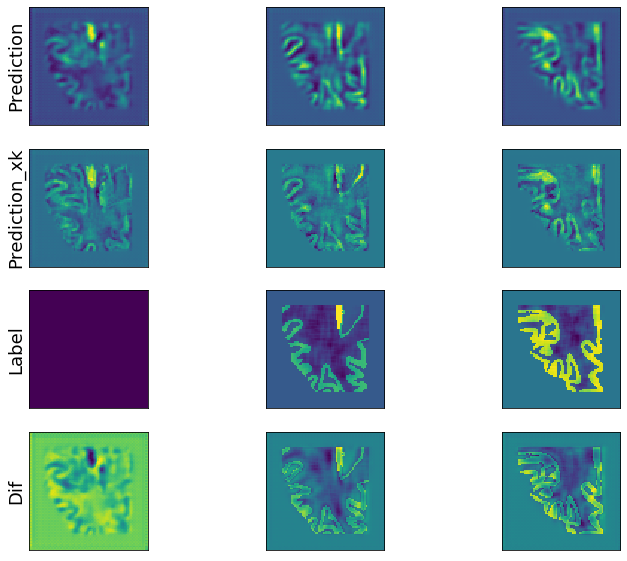

[Epoch 2/100] [Batch 11701/43600] [Model loss: 1.811631-0.903531-2.719731 ; nrmse: 0.903124]


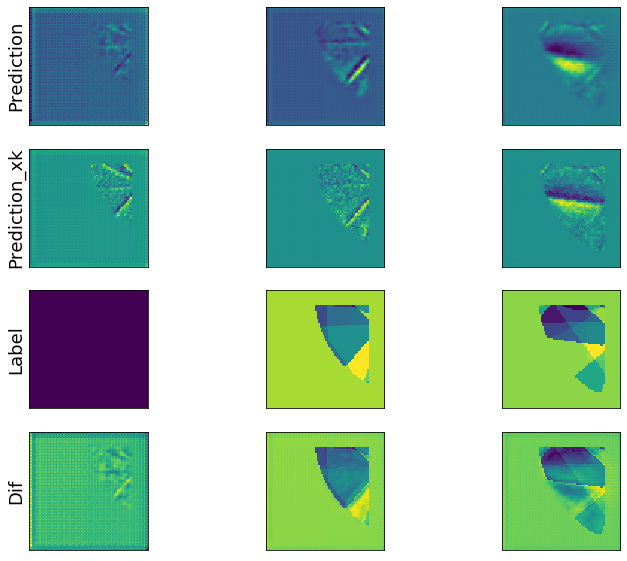

[Epoch 2/100] [Batch 12601/43600] [Model loss: 3.403507-0.824147-5.982866 ; nrmse: 0.822498]


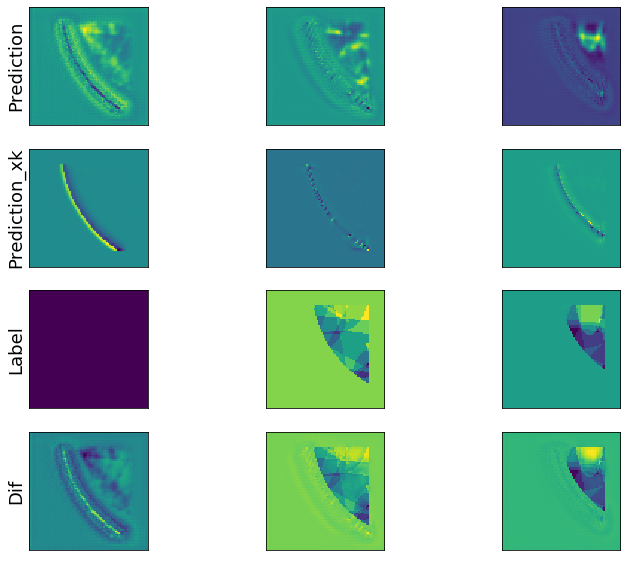

[Epoch 2/100] [Batch 13501/43600] [Model loss: 1.563570-0.865298-2.261842 ; nrmse: 0.865026]


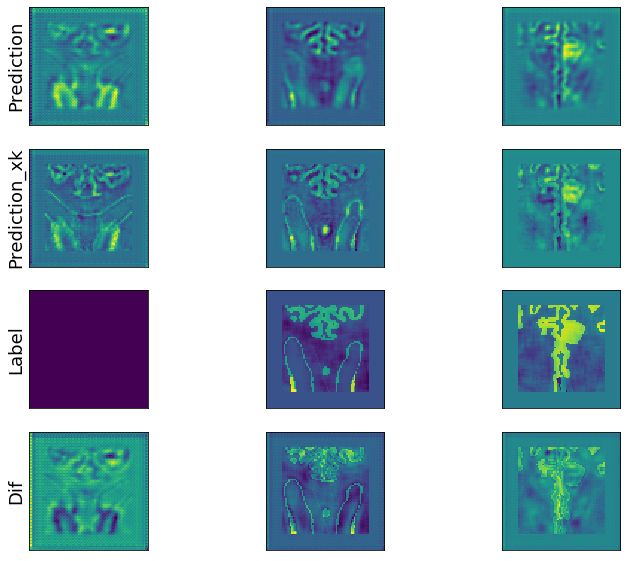

[Epoch 2/100] [Batch 14401/43600] [Model loss: 1.711437-0.883389-2.539486 ; nrmse: 0.883130]


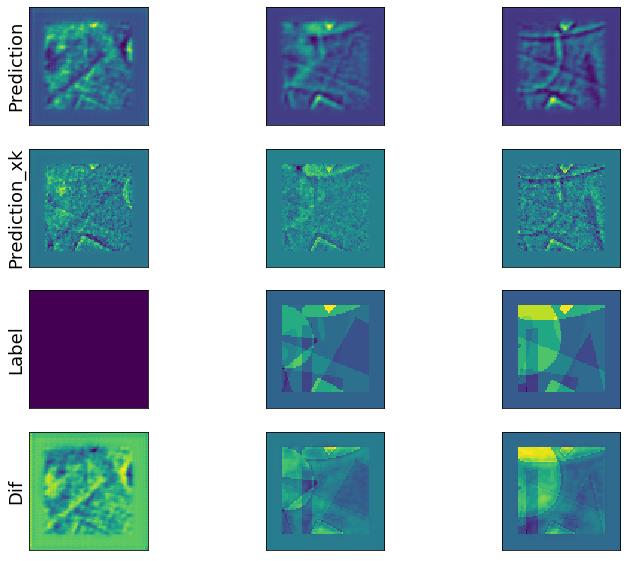

[Epoch 2/100] [Batch 15301/43600] [Model loss: 1.356180-0.861425-1.850935 ; nrmse: 0.857073]


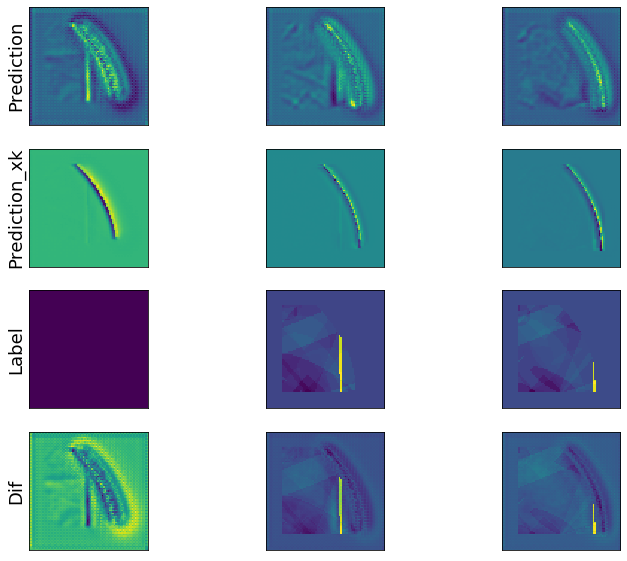

[Epoch 2/100] [Batch 16201/43600] [Model loss: 2.760903-0.953454-4.568351 ; nrmse: 0.952267]


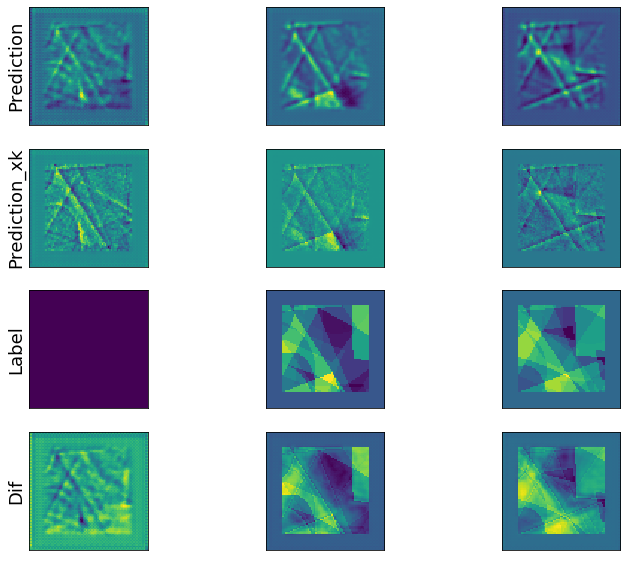

[Epoch 2/100] [Batch 17101/43600] [Model loss: 3.211266-0.861626-5.560905 ; nrmse: 0.861563]


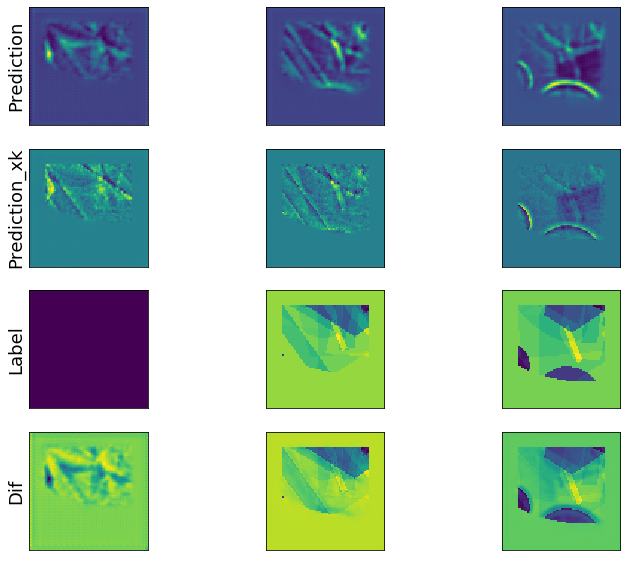

[Epoch 2/100] [Batch 18001/43600] [Model loss: 1.189598-0.882394-1.496802 ; nrmse: 0.882363]


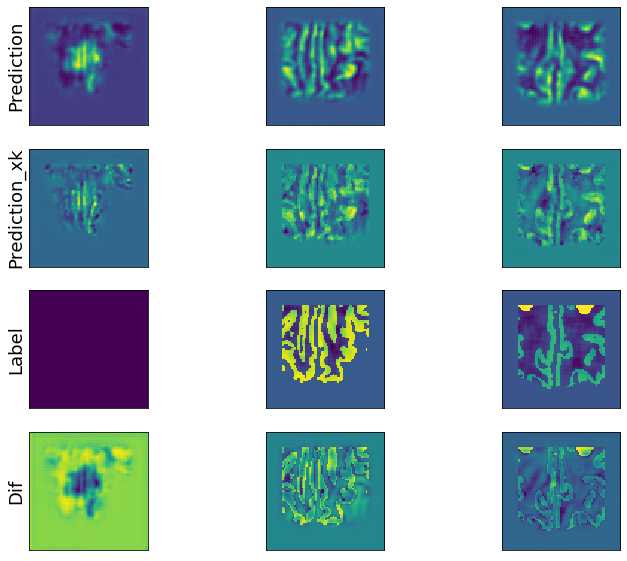

[Epoch 2/100] [Batch 18901/43600] [Model loss: 1.342597-0.947532-1.737661 ; nrmse: 0.939801]


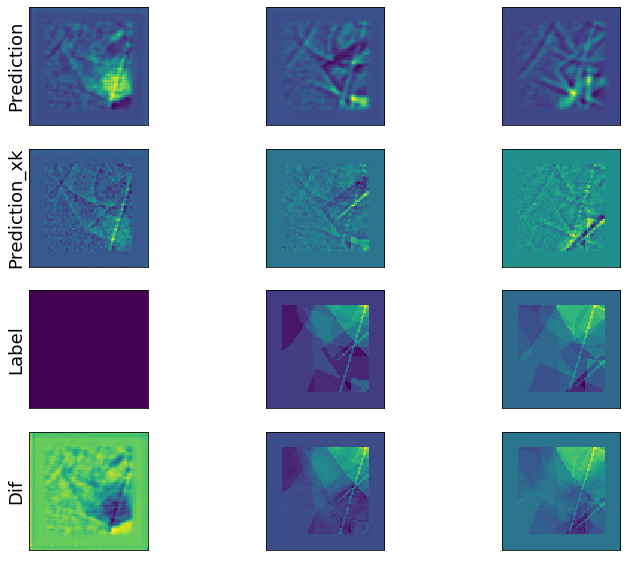

[Epoch 2/100] [Batch 19801/43600] [Model loss: 1.373223-0.807142-1.939304 ; nrmse: 0.806219]


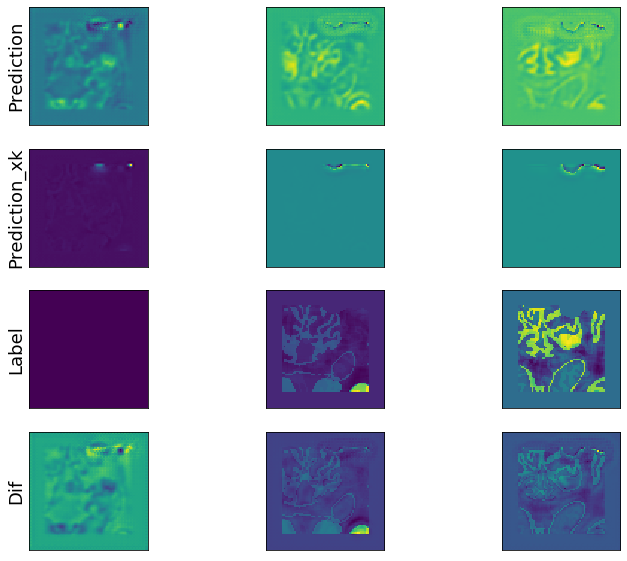

[Epoch 2/100] [Batch 20701/43600] [Model loss: 1.569536-0.905569-2.233503 ; nrmse: 0.900028]


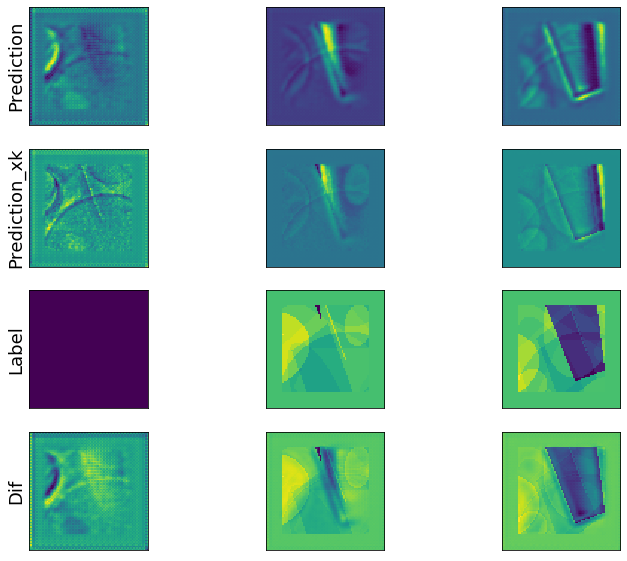

[Epoch 2/100] [Batch 21601/43600] [Model loss: 4.373878-0.875140-7.872616 ; nrmse: 0.873849]


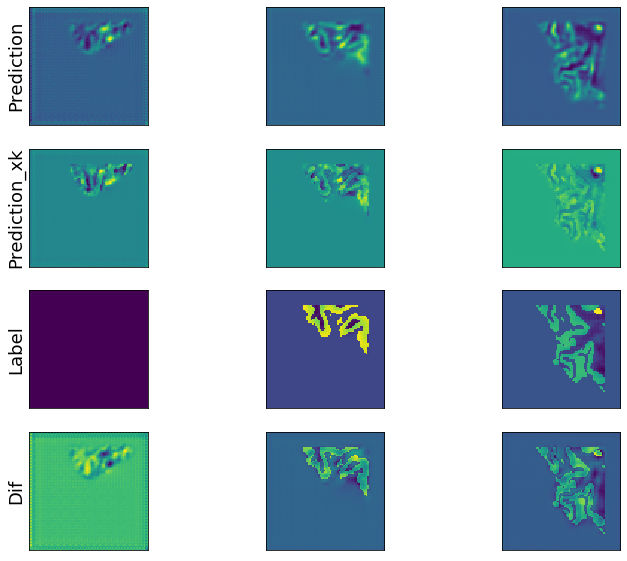

[Epoch 2/100] [Batch 22501/43600] [Model loss: 1.655591-0.823796-2.487387 ; nrmse: 0.822956]


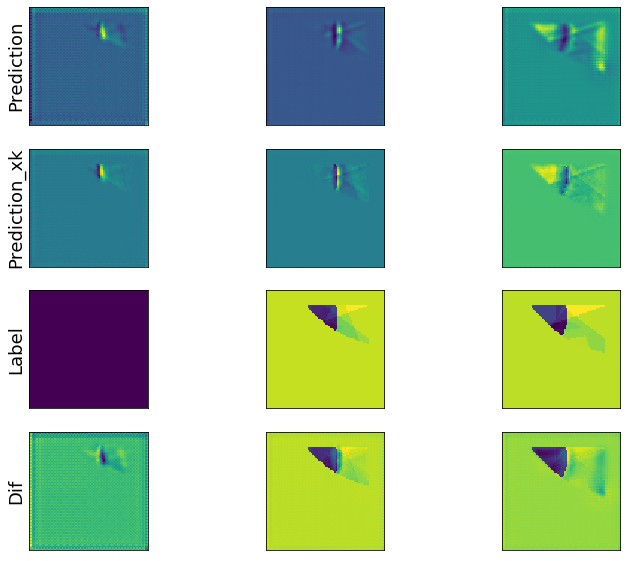

[Epoch 2/100] [Batch 23401/43600] [Model loss: 12.069721-0.902261-23.237183 ; nrmse: 0.899859]


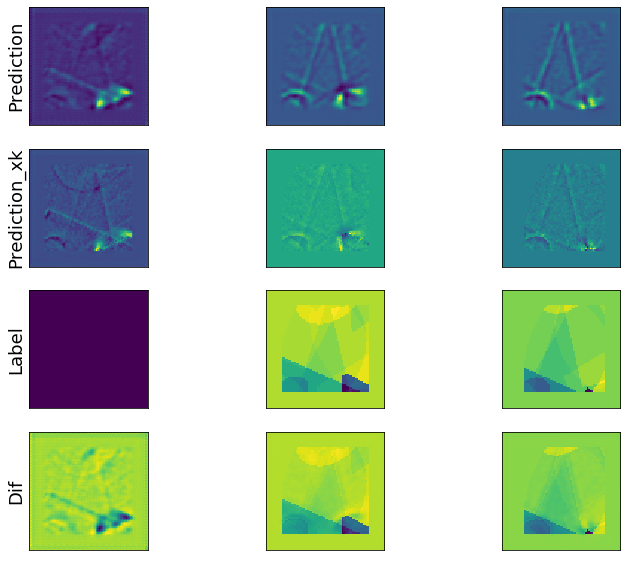

[Epoch 2/100] [Batch 24301/43600] [Model loss: 1.477324-0.939947-2.014701 ; nrmse: 0.938925]


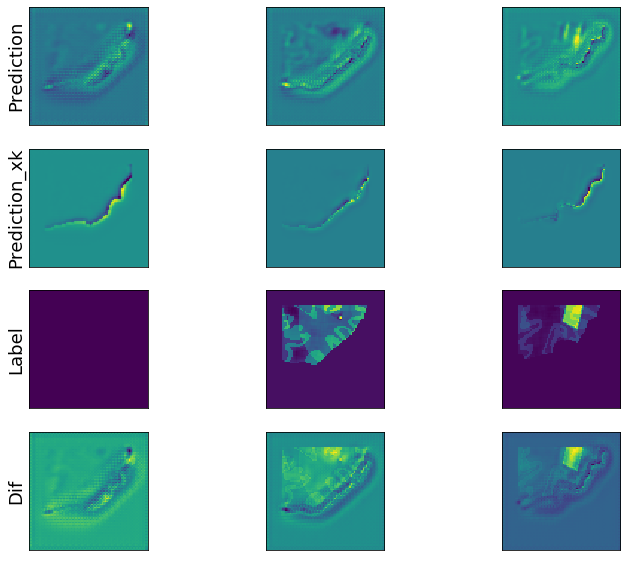

[Epoch 2/100] [Batch 25201/43600] [Model loss: 4.301373-0.772203-7.830543 ; nrmse: 0.772082]


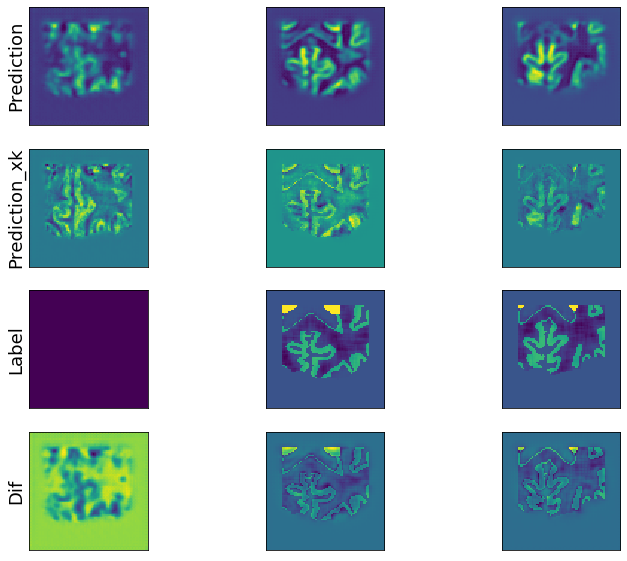

[Epoch 2/100] [Batch 26101/43600] [Model loss: 1.821514-0.835961-2.807067 ; nrmse: 0.835728]


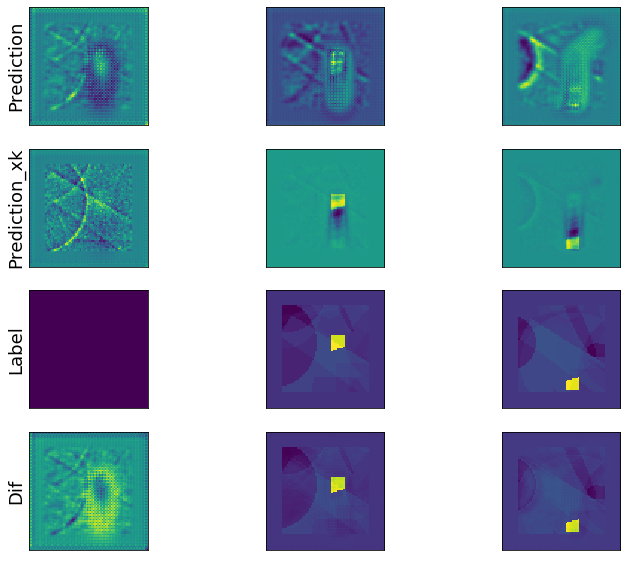

[Epoch 2/100] [Batch 27001/43600] [Model loss: 1.320832-0.823342-1.818321 ; nrmse: 0.820417]


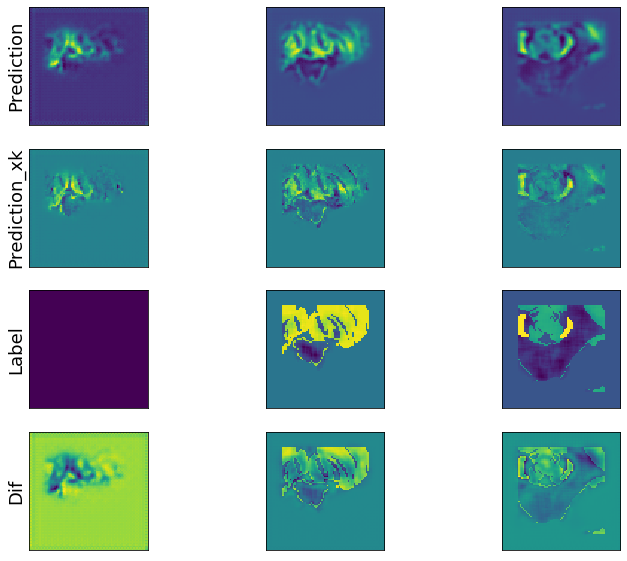

[Epoch 2/100] [Batch 27901/43600] [Model loss: 2.515921-0.903339-4.128502 ; nrmse: 0.902544]


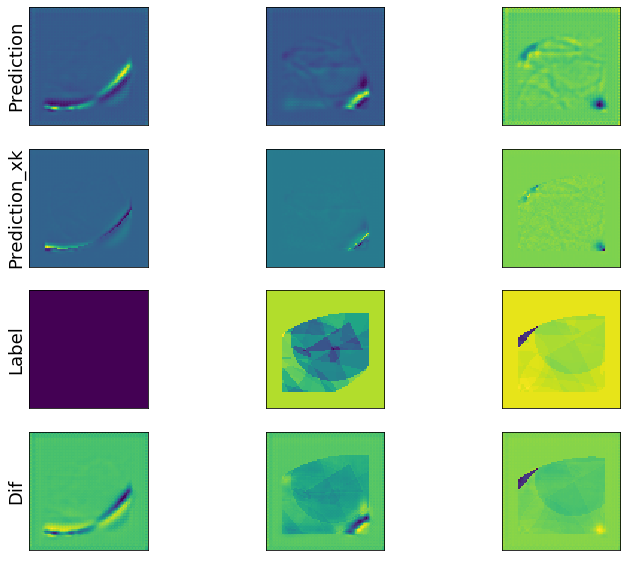

[Epoch 2/100] [Batch 28801/43600] [Model loss: 3.847984-0.925443-6.770524 ; nrmse: 0.923670]


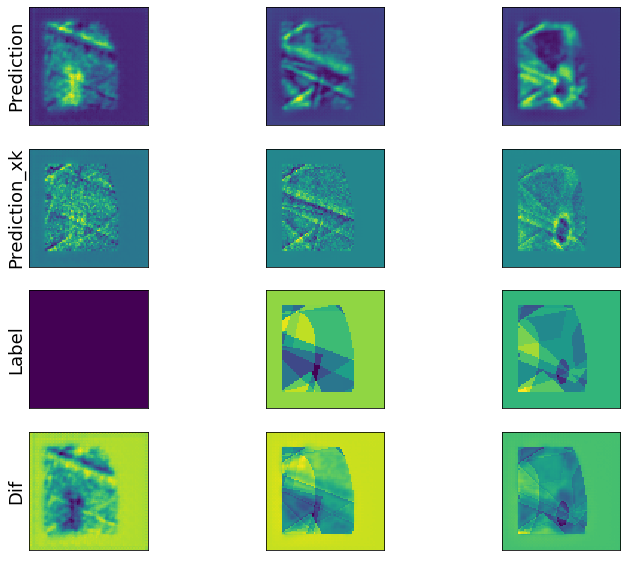

[Epoch 2/100] [Batch 29701/43600] [Model loss: 1.370886-0.854387-1.887385 ; nrmse: 0.854357]


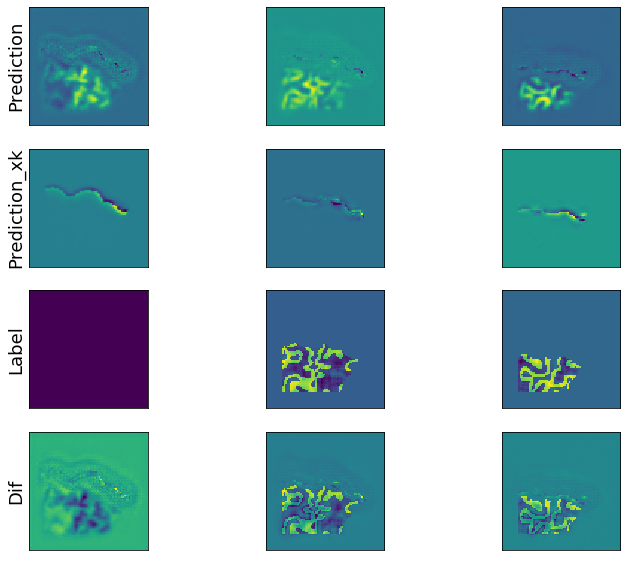

[Epoch 2/100] [Batch 30601/43600] [Model loss: 2.002600-0.936943-3.068256 ; nrmse: 0.935978]


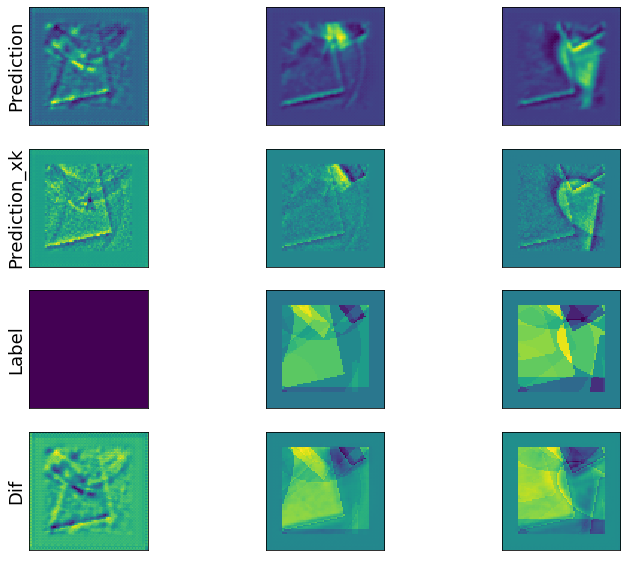

[Epoch 2/100] [Batch 31501/43600] [Model loss: 1.982287-0.873418-3.091156 ; nrmse: 0.872611]


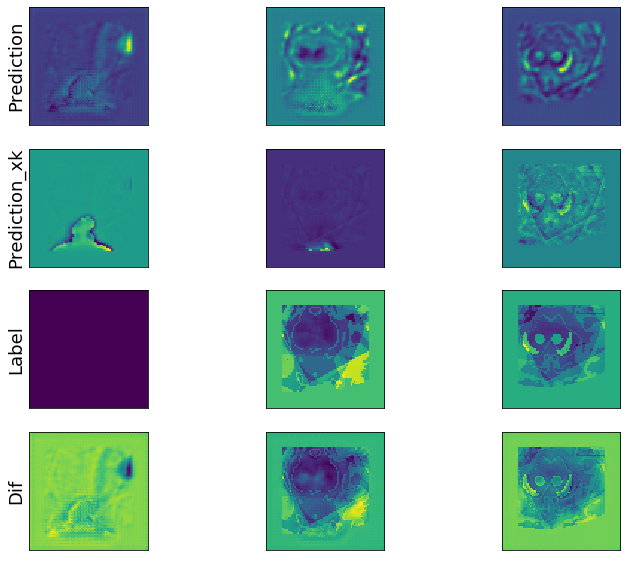

[Epoch 2/100] [Batch 32401/43600] [Model loss: 2.631760-0.851442-4.412078 ; nrmse: 0.851668]


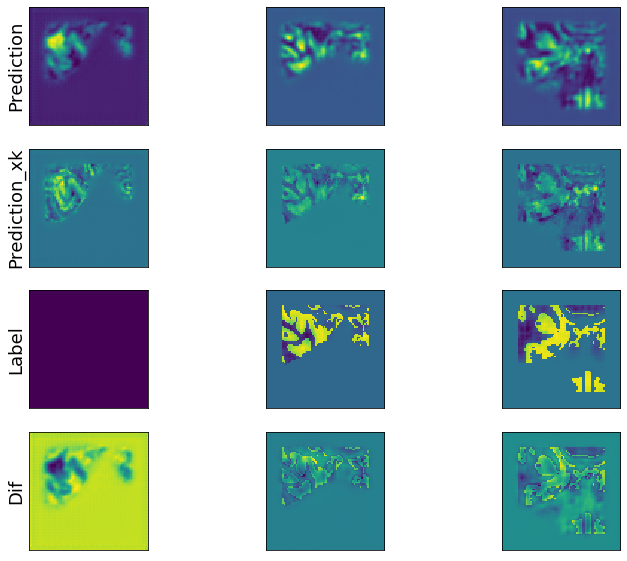

[Epoch 2/100] [Batch 33301/43600] [Model loss: 1.427760-0.784133-2.071387 ; nrmse: 0.784238]


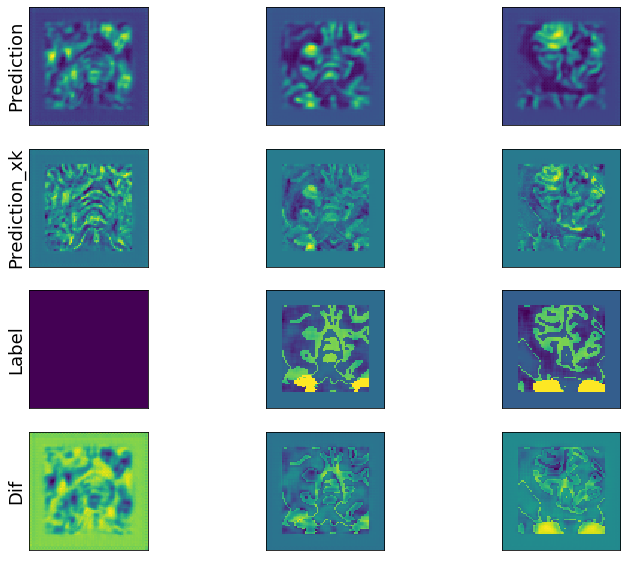

[Epoch 2/100] [Batch 34201/43600] [Model loss: 0.909747-0.859103-0.960390 ; nrmse: 0.857133]


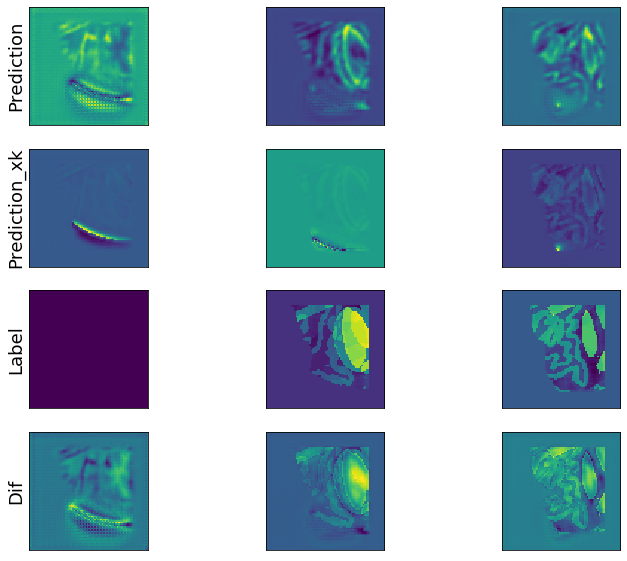

[Epoch 2/100] [Batch 35101/43600] [Model loss: 3.034782-0.909893-5.159672 ; nrmse: 0.906506]


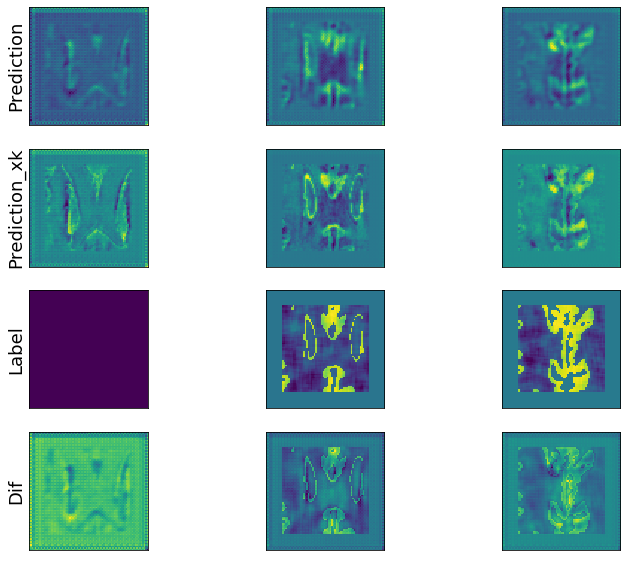

[Epoch 2/100] [Batch 36001/43600] [Model loss: 1.071259-0.840515-1.302002 ; nrmse: 0.840161]


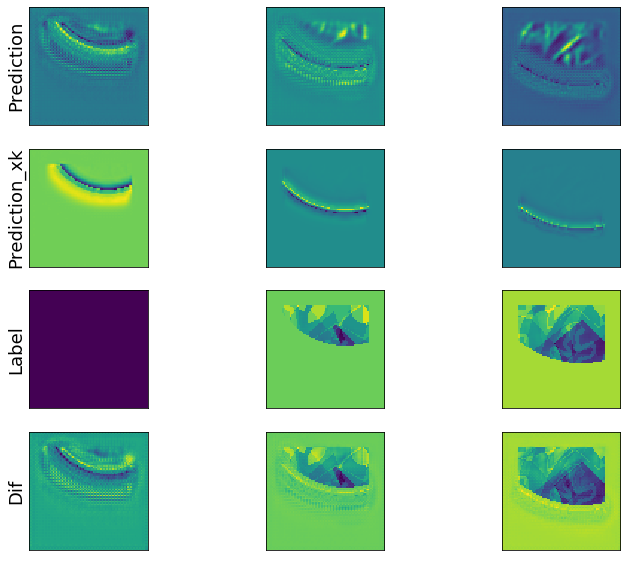

[Epoch 2/100] [Batch 36901/43600] [Model loss: 2.999421-0.855375-5.143468 ; nrmse: 0.855358]


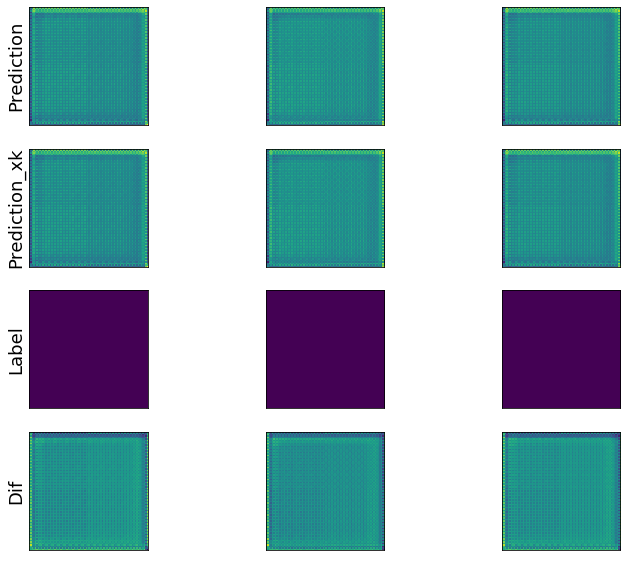

[Epoch 2/100] [Batch 37801/43600] [Model loss: 1.363022-0.873860-1.852183 ; nrmse: 0.871939]


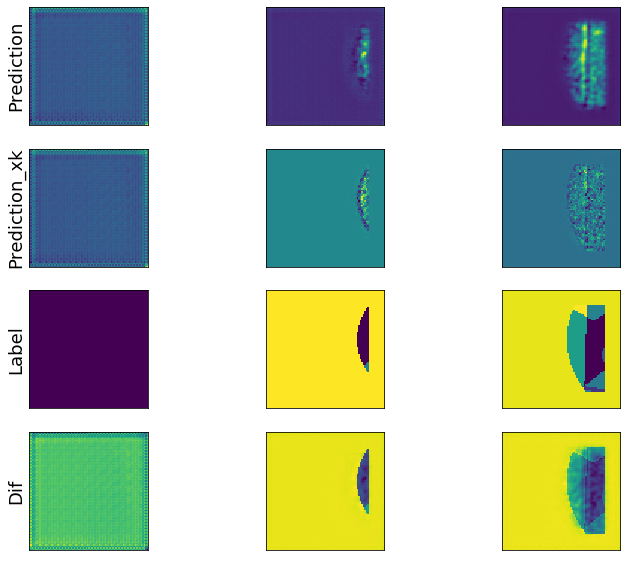

[Epoch 2/100] [Batch 38701/43600] [Model loss: 1.157392-0.857414-1.457369 ; nrmse: 0.857706]


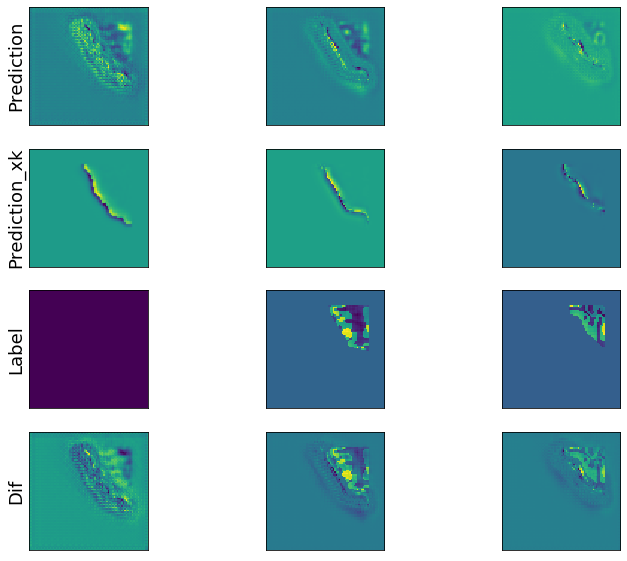

[Epoch 2/100] [Batch 39601/43600] [Model loss: 1.501485-0.811776-2.191194 ; nrmse: 0.811594]


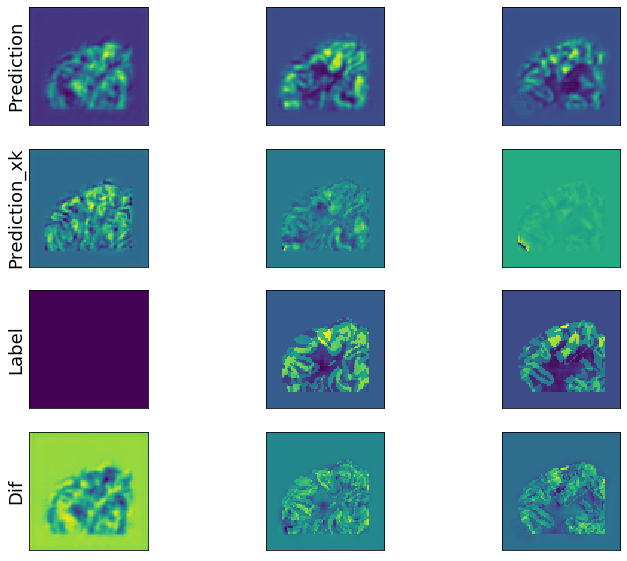

[Epoch 2/100] [Batch 40501/43600] [Model loss: 2.847357-0.963898-4.730816 ; nrmse: 0.956996]


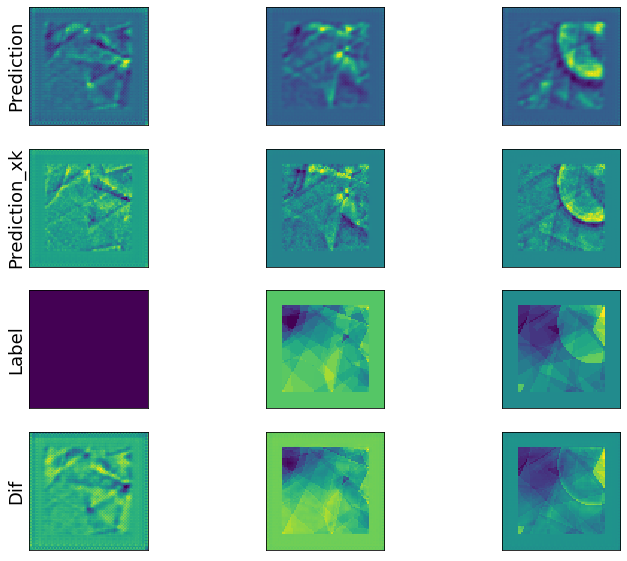

[Epoch 2/100] [Batch 41401/43600] [Model loss: 3.044280-0.845369-5.243192 ; nrmse: 0.845154]


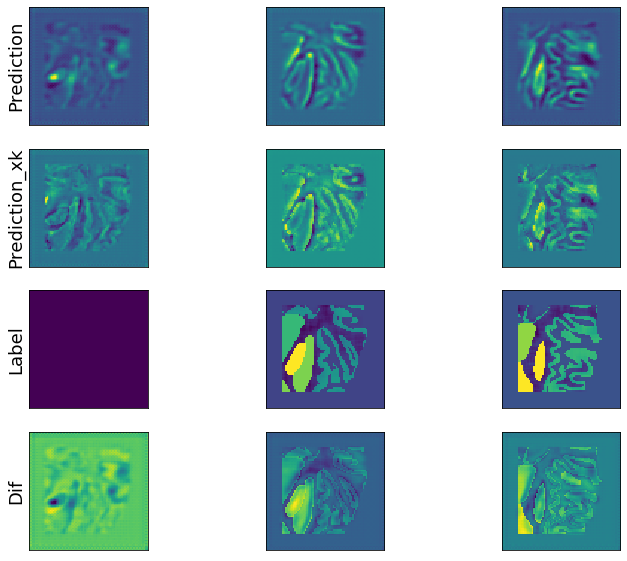

[Epoch 2/100] [Batch 42301/43600] [Model loss: 1.297883-0.911934-1.683831 ; nrmse: 0.909869]


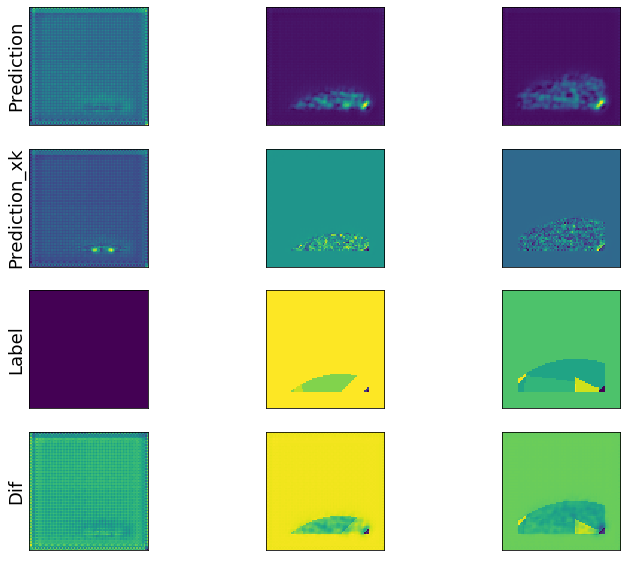

[Epoch 2/100] [Batch 43201/43600] [Model loss: 1.239688-0.872304-1.607072 ; nrmse: 0.872190]


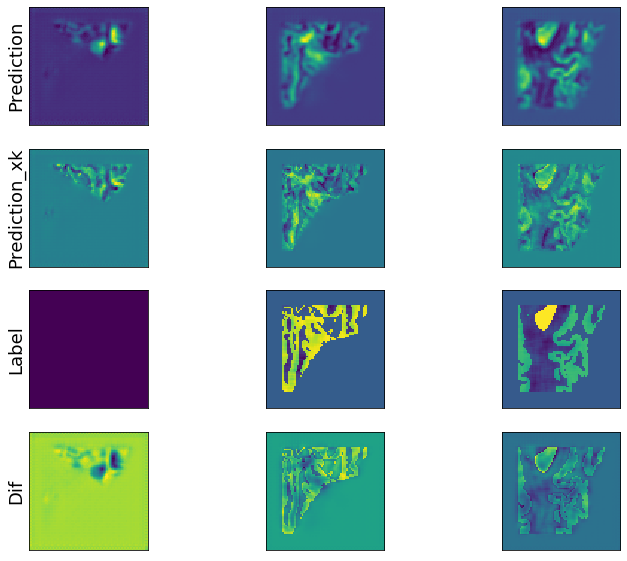

Epoch: 0002 Training_cost= 2.49512


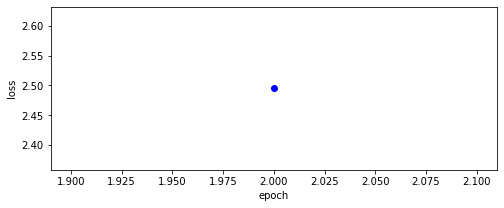

[Epoch 3/100] [Batch 1/43600] [Model loss: 6.162769-0.800016-11.525522 ; nrmse: 0.798654]


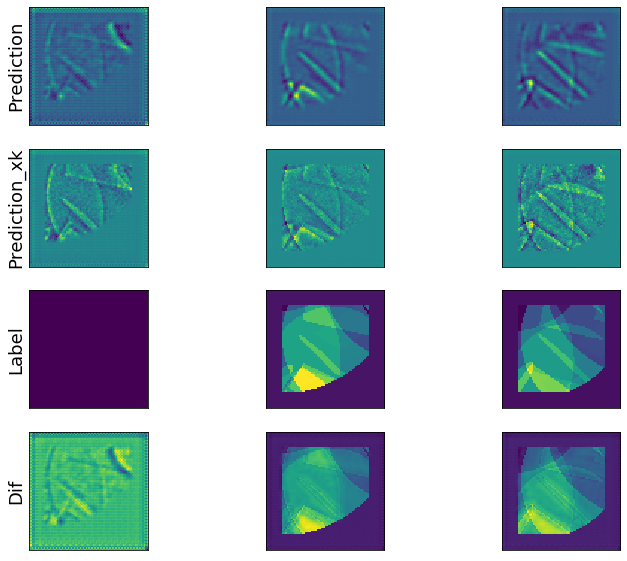

[Epoch 3/100] [Batch 901/43600] [Model loss: 1.302007-0.868530-1.735484 ; nrmse: 0.868191]


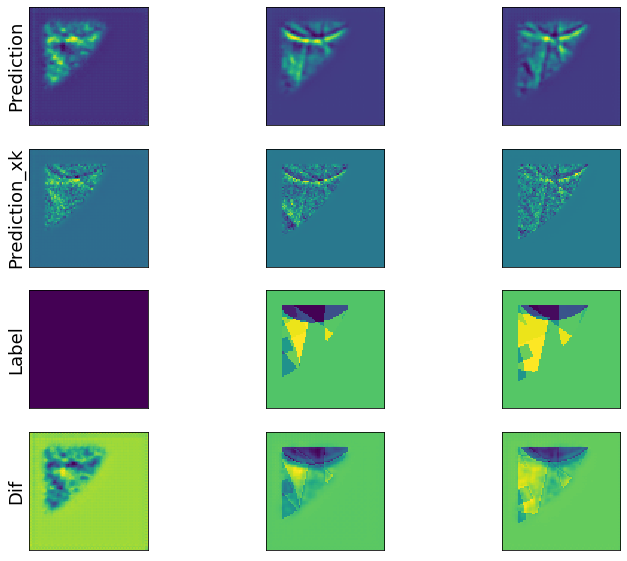

[Epoch 3/100] [Batch 1801/43600] [Model loss: 10.352462-0.844317-19.860607 ; nrmse: 0.845028]


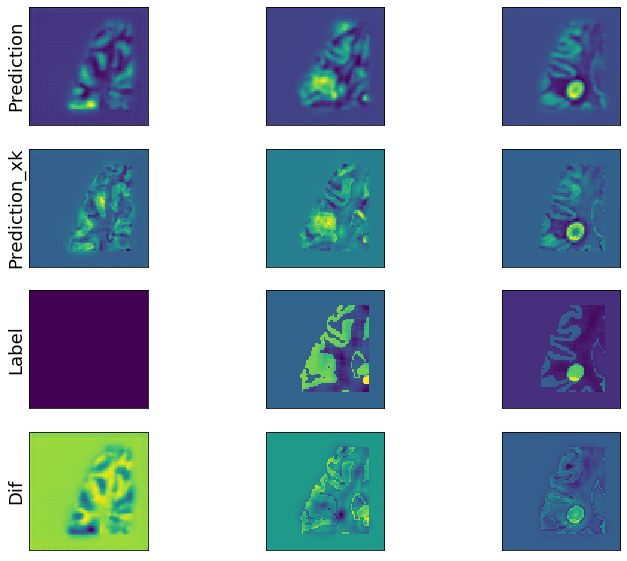

[Epoch 3/100] [Batch 2701/43600] [Model loss: 2.852814-0.800323-4.905306 ; nrmse: 0.799397]


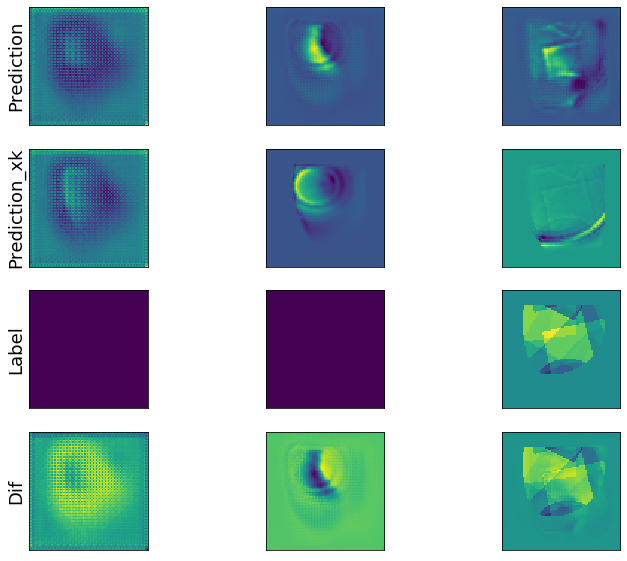

[Epoch 3/100] [Batch 3601/43600] [Model loss: 2.565468-0.914335-4.216602 ; nrmse: 0.914255]


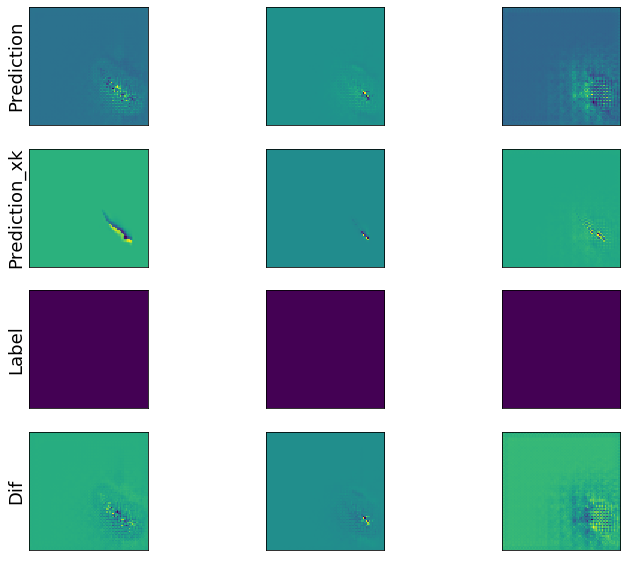

[Epoch 3/100] [Batch 4501/43600] [Model loss: 1.359096-0.925260-1.792932 ; nrmse: 0.924935]


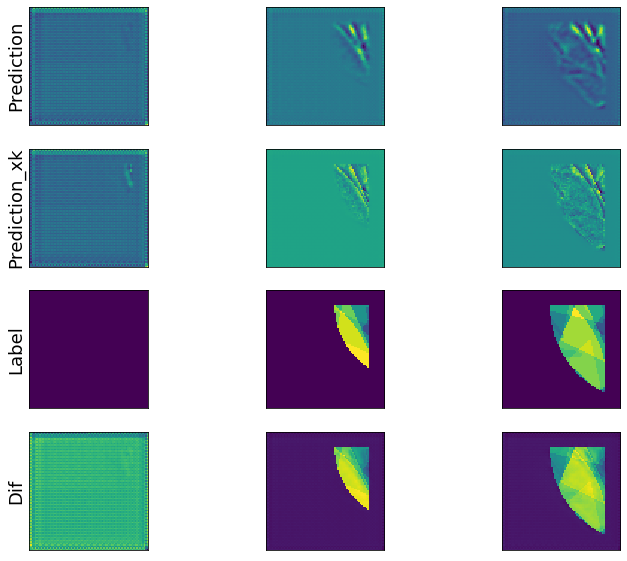

[Epoch 3/100] [Batch 5401/43600] [Model loss: 1.047953-0.890584-1.205322 ; nrmse: 0.889077]


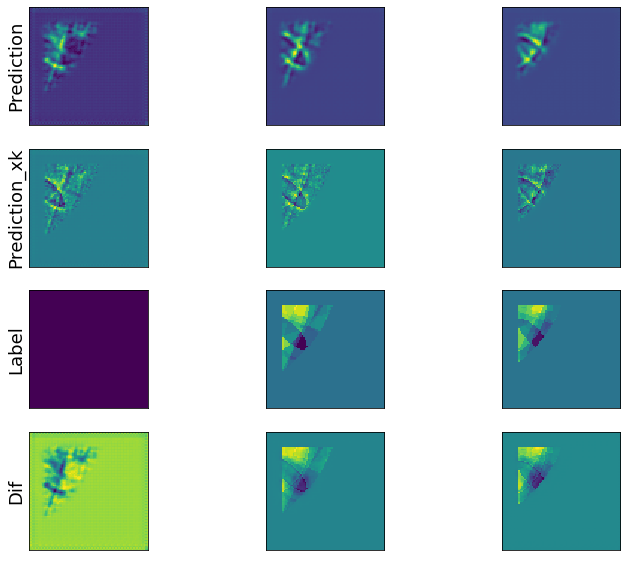

[Epoch 3/100] [Batch 6301/43600] [Model loss: 1.330931-0.824730-1.837131 ; nrmse: 0.825334]


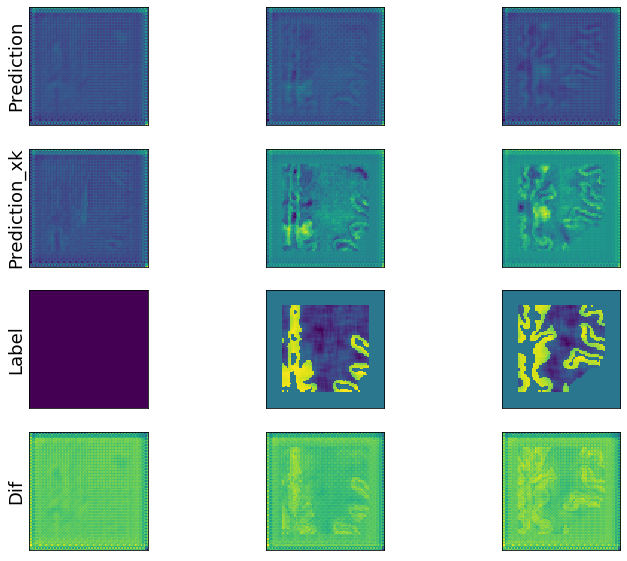

[Epoch 3/100] [Batch 7201/43600] [Model loss: 1.040629-0.911155-1.170104 ; nrmse: 0.909624]


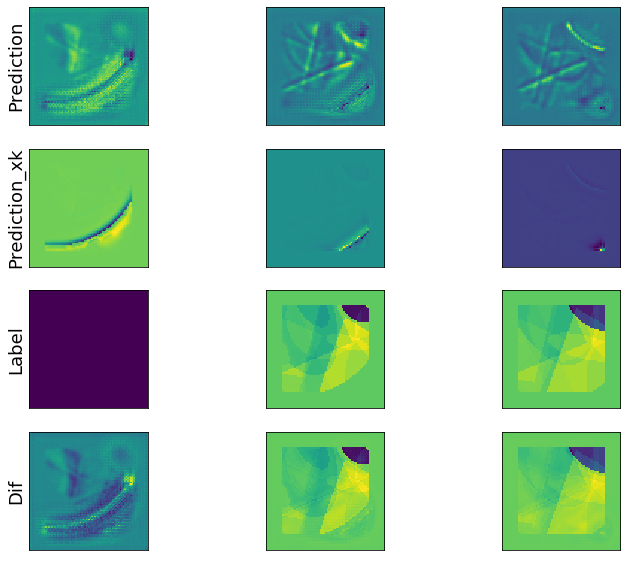

[Epoch 3/100] [Batch 8101/43600] [Model loss: 2.707001-0.870816-4.543187 ; nrmse: 0.871137]


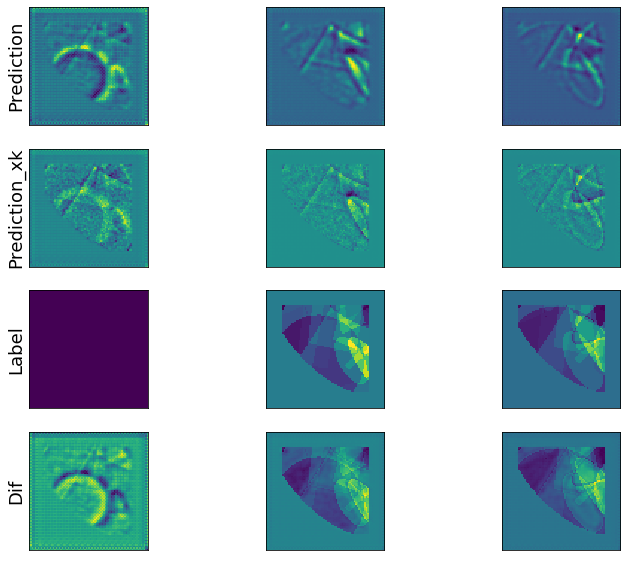

[Epoch 3/100] [Batch 9001/43600] [Model loss: 3.124260-0.940069-5.308451 ; nrmse: 0.939229]


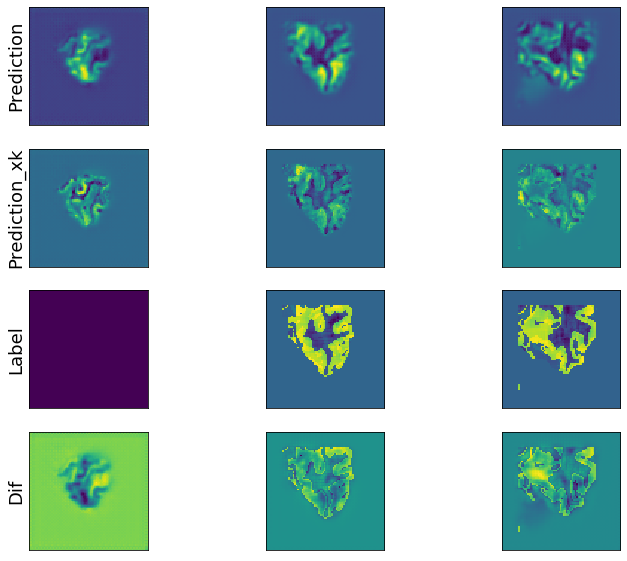

[Epoch 3/100] [Batch 9901/43600] [Model loss: 1.916555-0.814156-3.018955 ; nrmse: 0.814442]


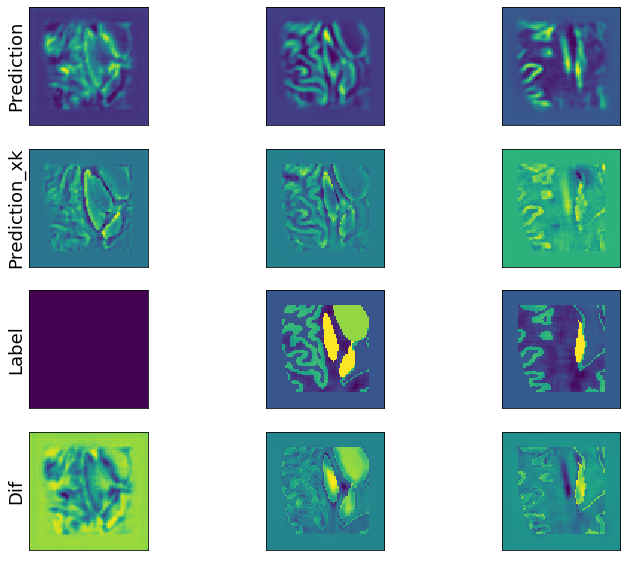

[Epoch 3/100] [Batch 10801/43600] [Model loss: 1.530120-0.877476-2.182764 ; nrmse: 0.877097]


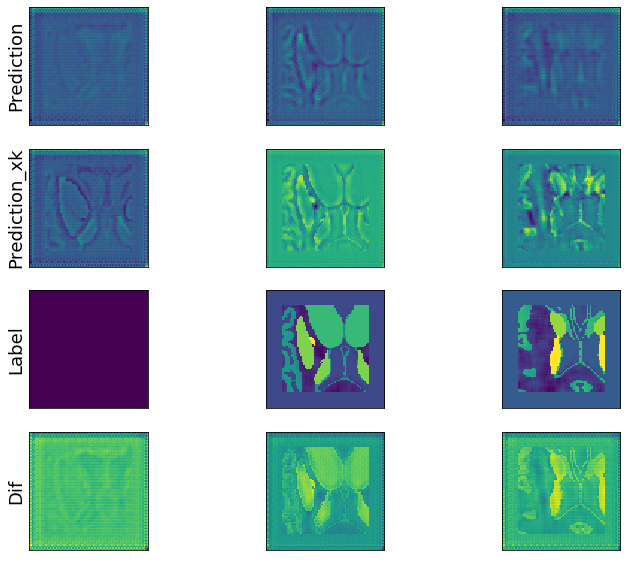

[Epoch 3/100] [Batch 11701/43600] [Model loss: 1.435360-0.848540-2.022181 ; nrmse: 0.846638]


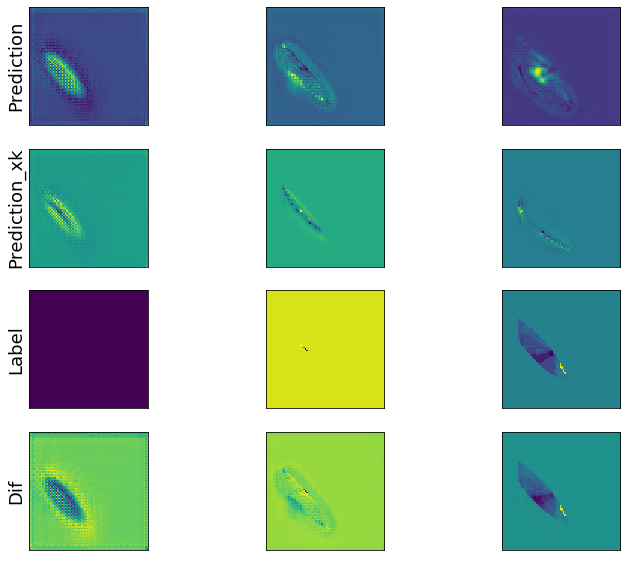

[Epoch 3/100] [Batch 12601/43600] [Model loss: 1.255800-0.813280-1.698319 ; nrmse: 0.811004]


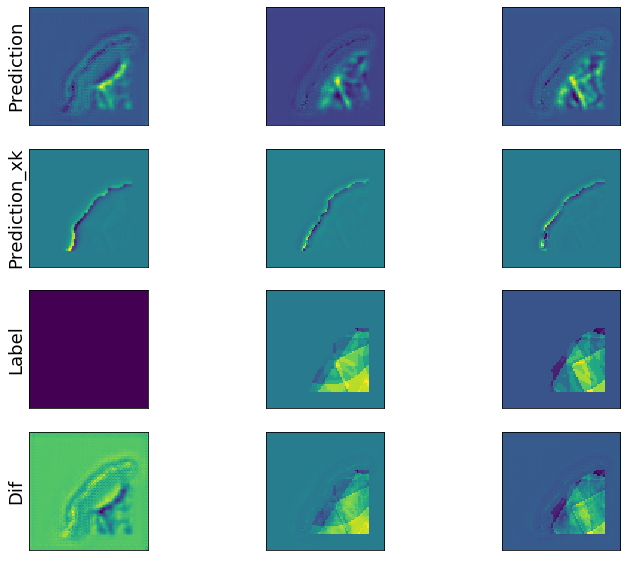

[Epoch 3/100] [Batch 13501/43600] [Model loss: 3.121941-0.871106-5.372776 ; nrmse: 0.867514]


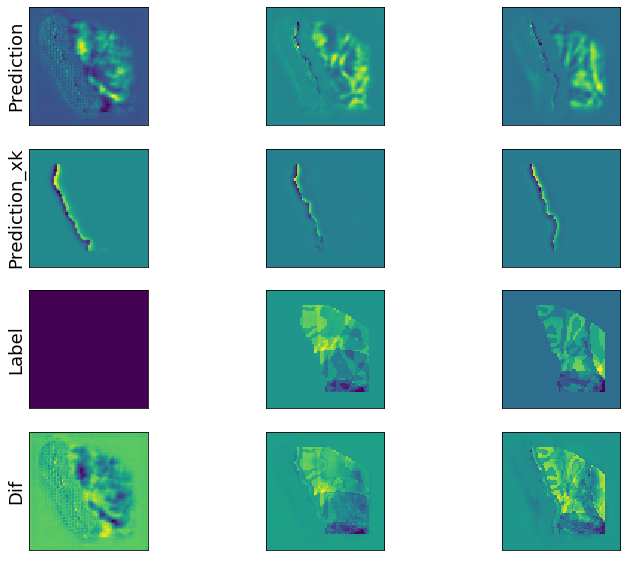

[Epoch 3/100] [Batch 14401/43600] [Model loss: 3.668505-0.944940-6.392070 ; nrmse: 0.944546]


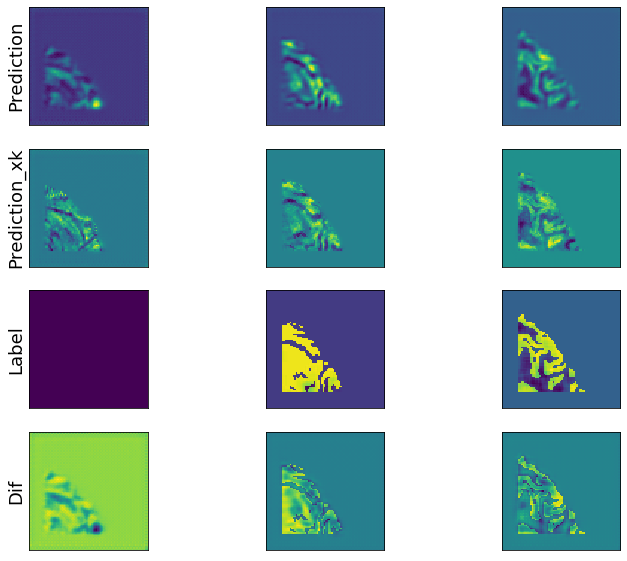

[Epoch 3/100] [Batch 15301/43600] [Model loss: 2.814003-0.900980-4.727025 ; nrmse: 0.901079]


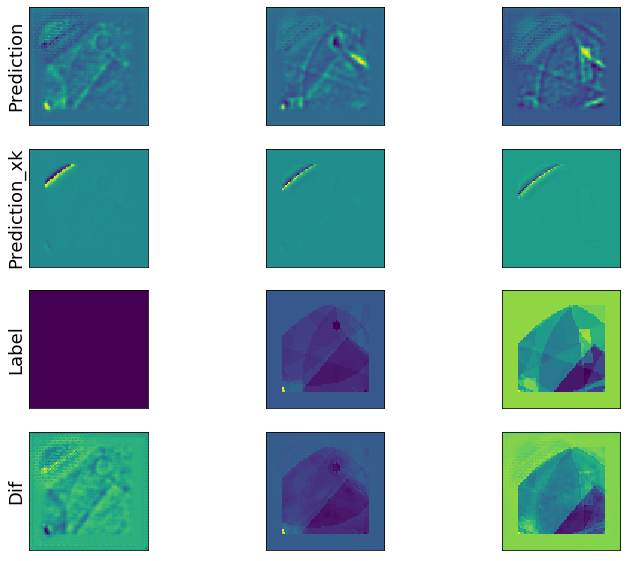

[Epoch 3/100] [Batch 16201/43600] [Model loss: 4.415782-0.888455-7.943110 ; nrmse: 0.884351]


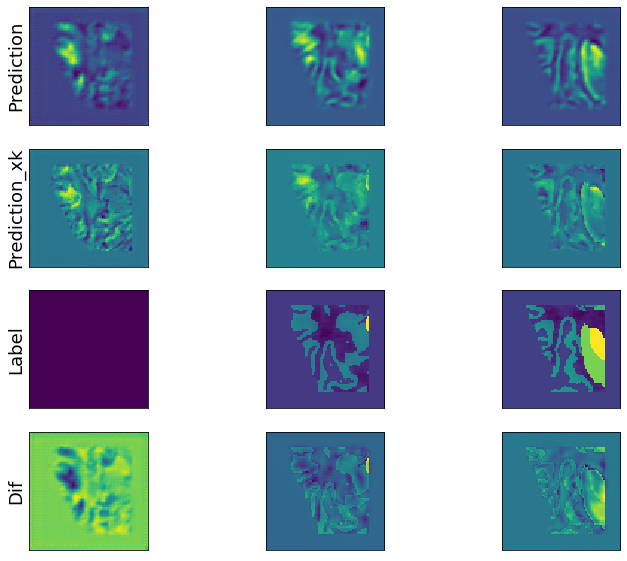

[Epoch 3/100] [Batch 17101/43600] [Model loss: 2.583459-0.855682-4.311236 ; nrmse: 0.850632]


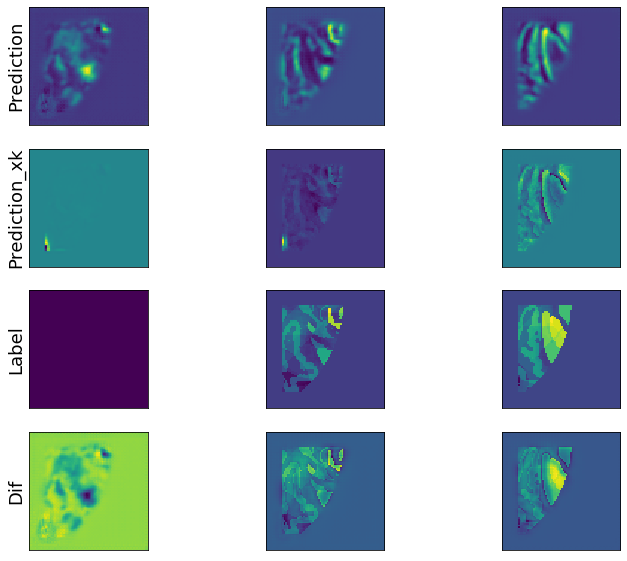

[Epoch 3/100] [Batch 18001/43600] [Model loss: 1.029969-0.918574-1.141364 ; nrmse: 0.916391]


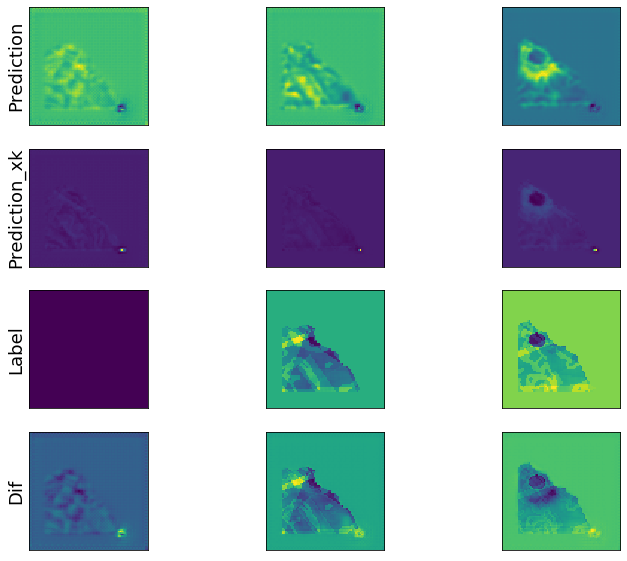

[Epoch 3/100] [Batch 18901/43600] [Model loss: 1.211092-0.899189-1.522995 ; nrmse: 0.896248]


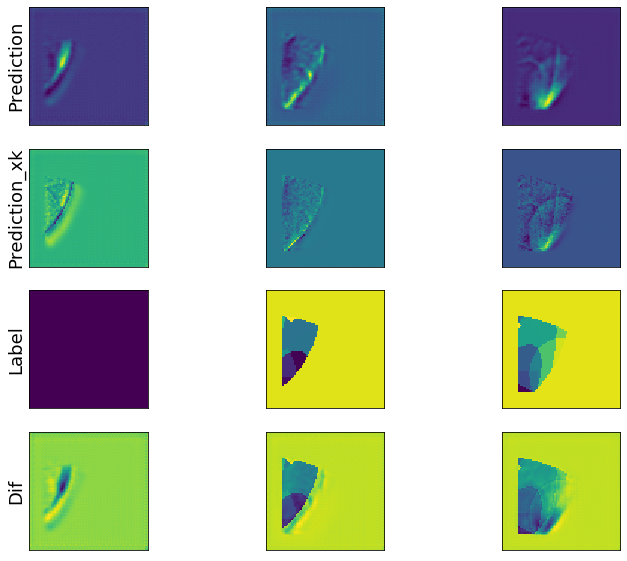

[Epoch 3/100] [Batch 19801/43600] [Model loss: 1.775120-0.895441-2.654800 ; nrmse: 0.895084]


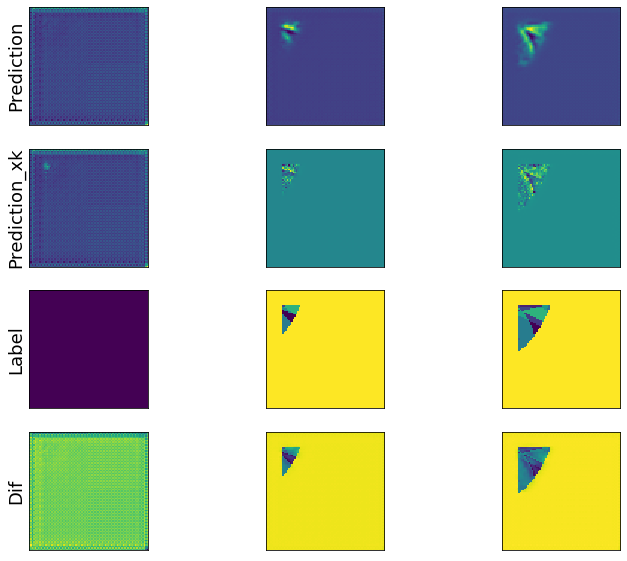

[Epoch 3/100] [Batch 20701/43600] [Model loss: 2.336729-0.889738-3.783720 ; nrmse: 0.889321]


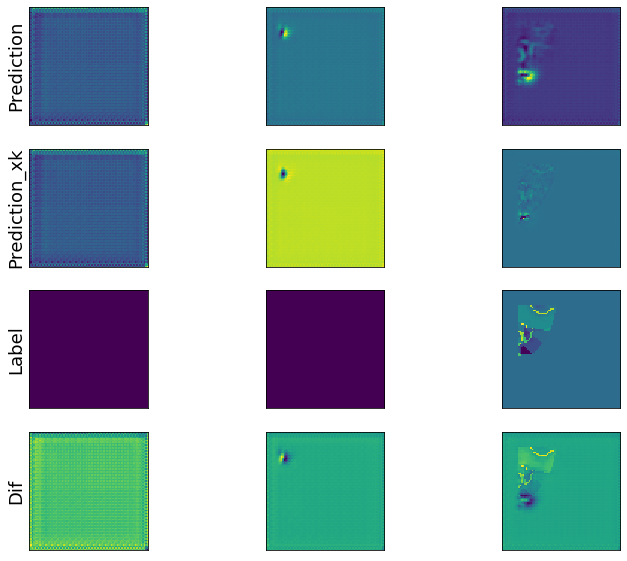

[Epoch 3/100] [Batch 21601/43600] [Model loss: 7.164695-0.940266-13.389125 ; nrmse: 0.934066]


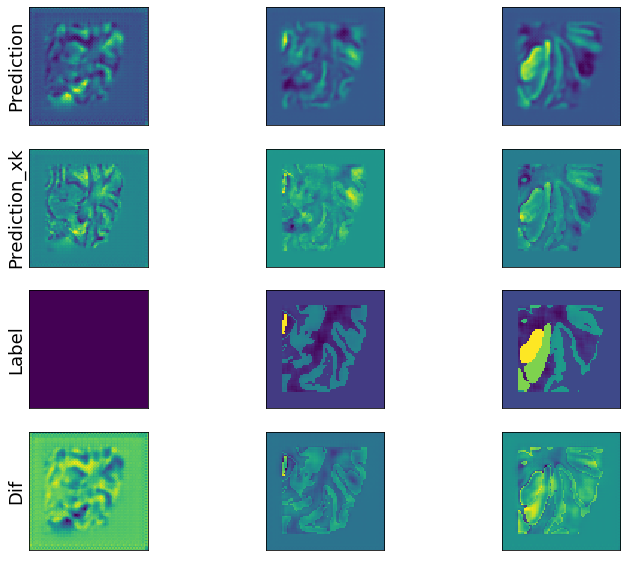

[Epoch 3/100] [Batch 22501/43600] [Model loss: 0.949076-0.878809-1.019343 ; nrmse: 0.878652]


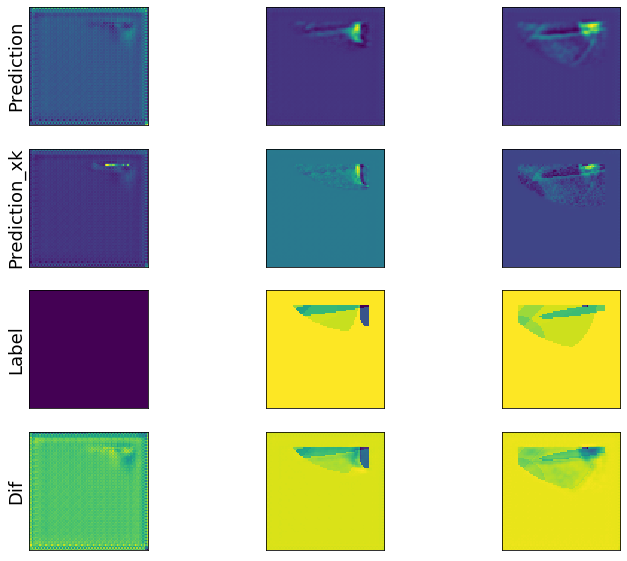

[Epoch 3/100] [Batch 23401/43600] [Model loss: 3.298271-0.848372-5.748169 ; nrmse: 0.846903]


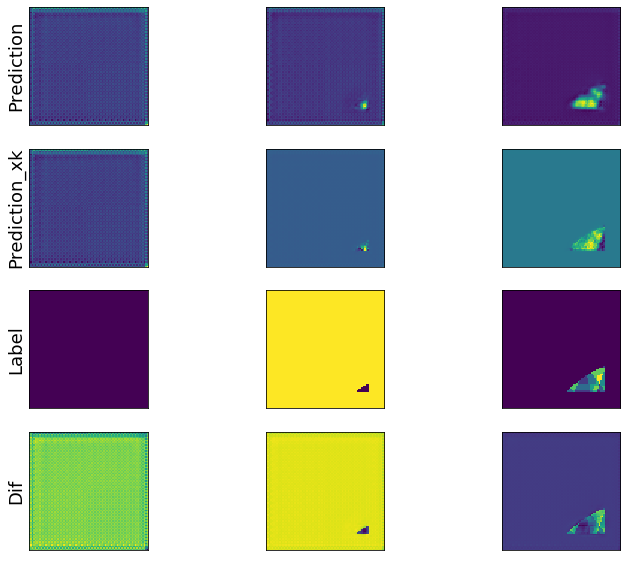

[Epoch 3/100] [Batch 24301/43600] [Model loss: 1.555942-0.882711-2.229173 ; nrmse: 0.880709]


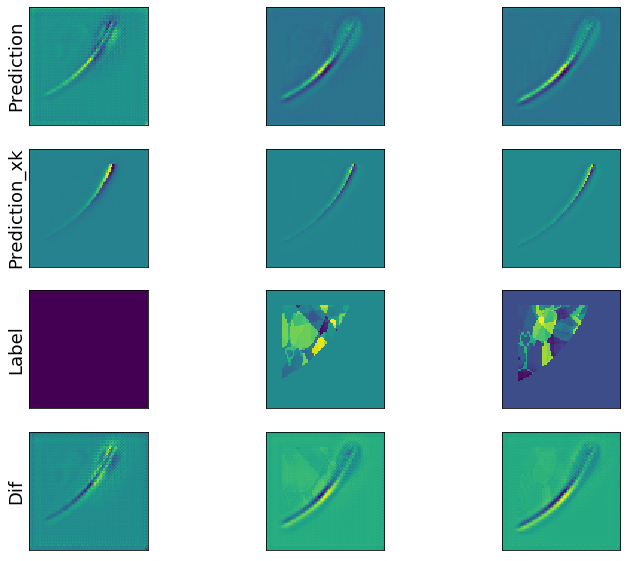

[Epoch 3/100] [Batch 25201/43600] [Model loss: 1.460009-0.875022-2.044995 ; nrmse: 0.874239]


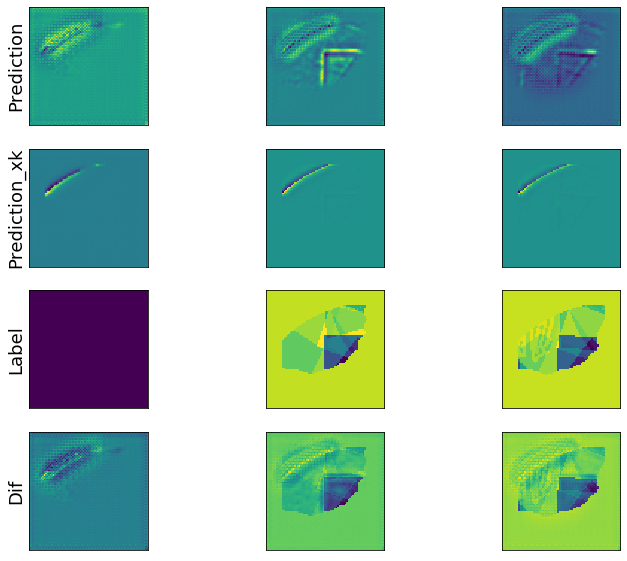

[Epoch 3/100] [Batch 26101/43600] [Model loss: 1.611851-0.890087-2.333615 ; nrmse: 0.888468]


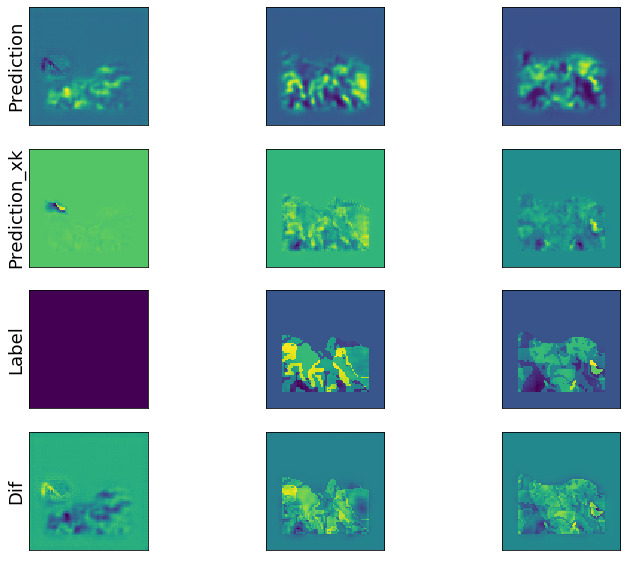

[Epoch 3/100] [Batch 27001/43600] [Model loss: 4.494469-0.898298-8.090640 ; nrmse: 0.899368]


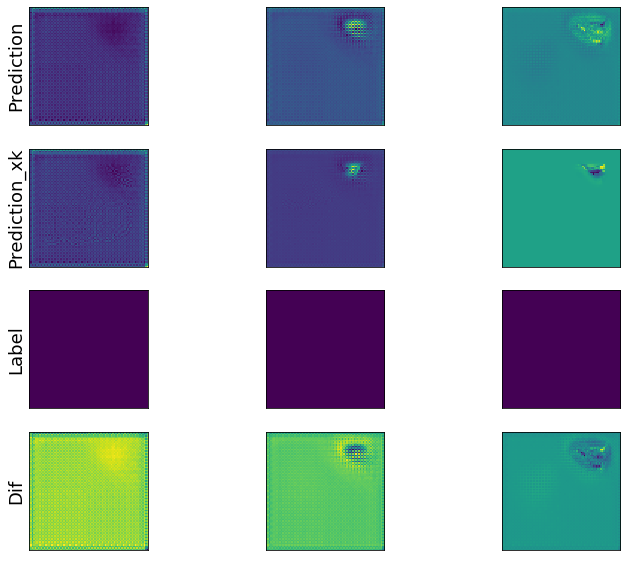

[Epoch 3/100] [Batch 27901/43600] [Model loss: 2.364167-0.803672-3.924662 ; nrmse: 0.802886]


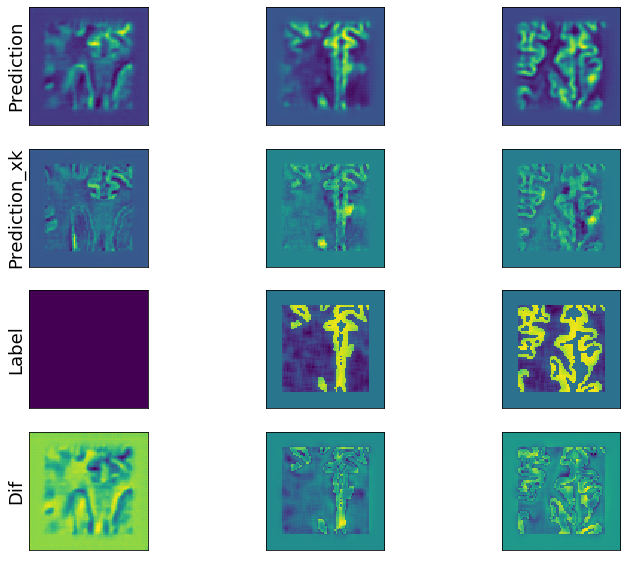

[Epoch 3/100] [Batch 28801/43600] [Model loss: 7.430724-0.869935-13.991512 ; nrmse: 0.874620]


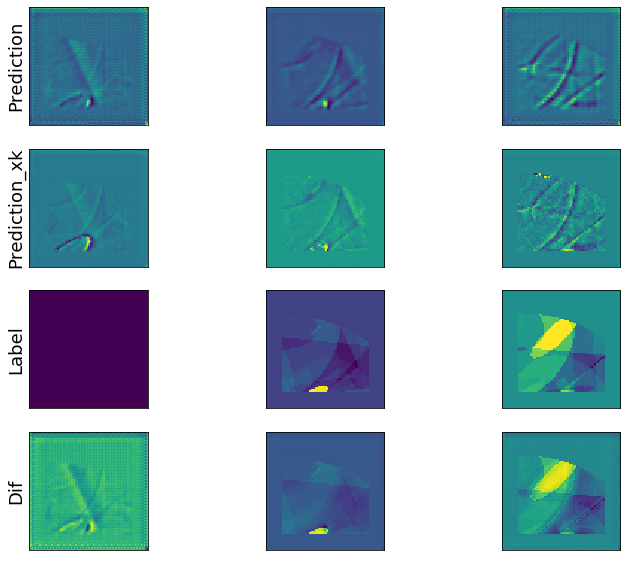

[Epoch 3/100] [Batch 29701/43600] [Model loss: 3.350901-0.828460-5.873342 ; nrmse: 0.827613]


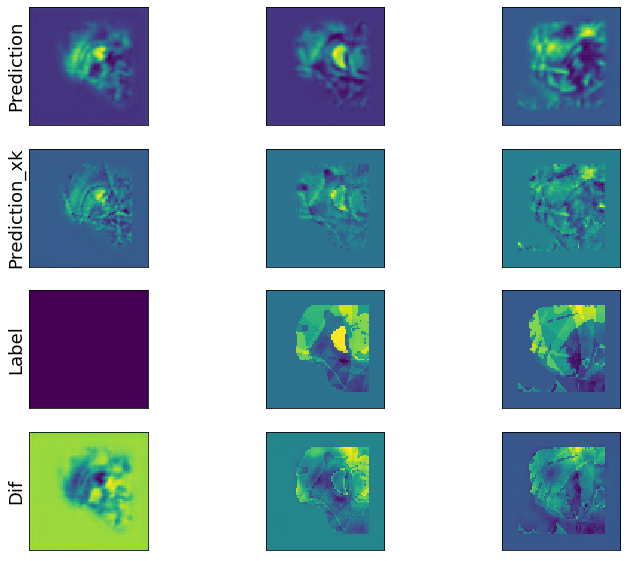

[Epoch 3/100] [Batch 30601/43600] [Model loss: 1.925931-0.897682-2.954179 ; nrmse: 0.898562]


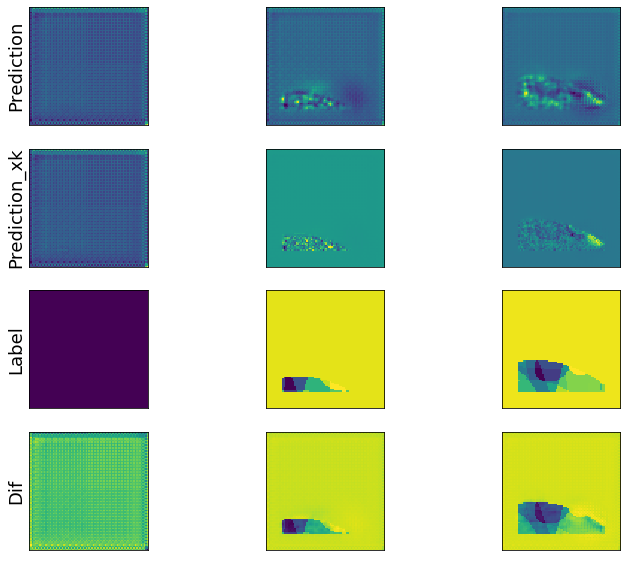

[Epoch 3/100] [Batch 31501/43600] [Model loss: 1.823688-0.866170-2.781205 ; nrmse: 0.865237]


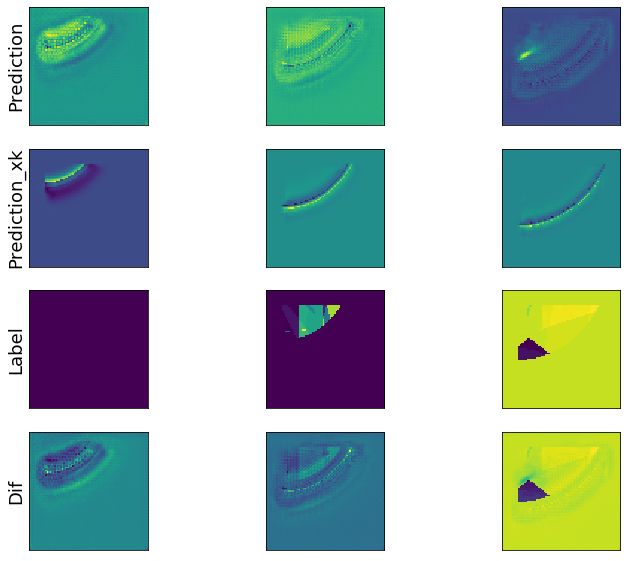

[Epoch 3/100] [Batch 32401/43600] [Model loss: 2.966100-0.838044-5.094155 ; nrmse: 0.838102]


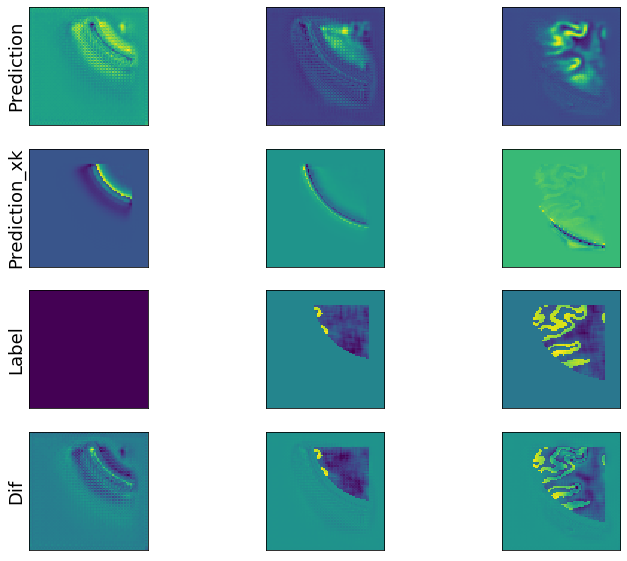

[Epoch 3/100] [Batch 33301/43600] [Model loss: 18.018274-0.852745-35.183804 ; nrmse: 0.852724]


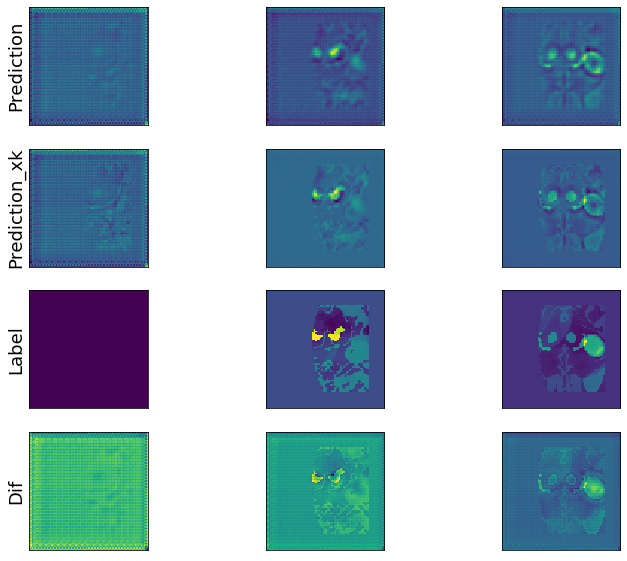

[Epoch 3/100] [Batch 34201/43600] [Model loss: 1.442049-0.796078-2.088021 ; nrmse: 0.796316]


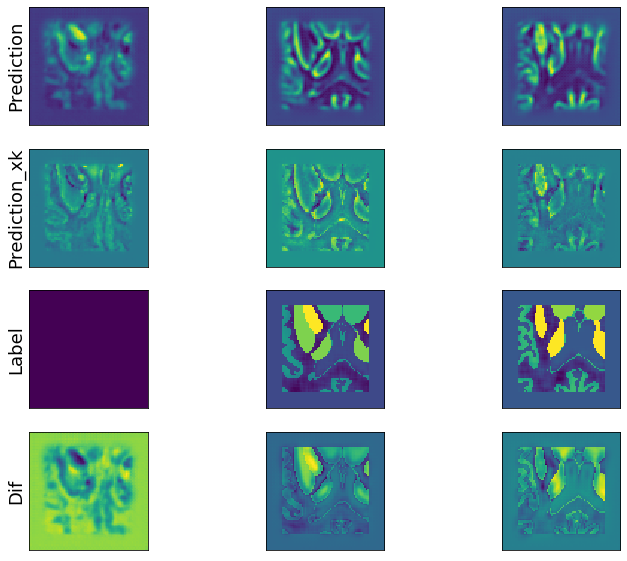

[Epoch 3/100] [Batch 35101/43600] [Model loss: 2.182725-0.831082-3.534367 ; nrmse: 0.829887]


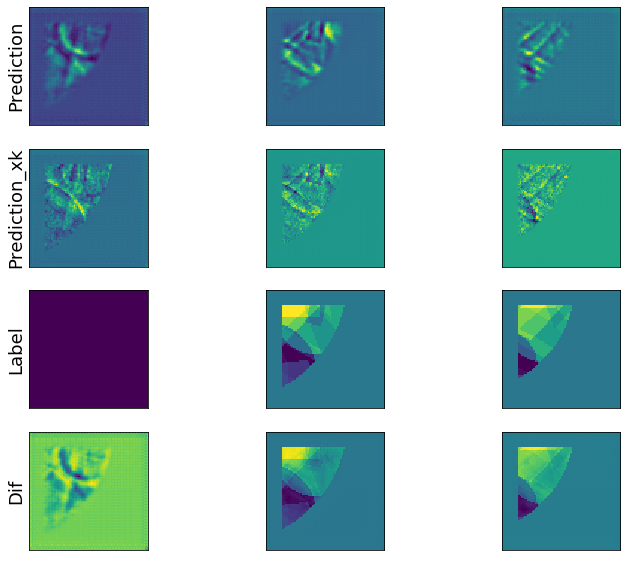

[Epoch 3/100] [Batch 36001/43600] [Model loss: 1.257578-0.854292-1.660865 ; nrmse: 0.854615]


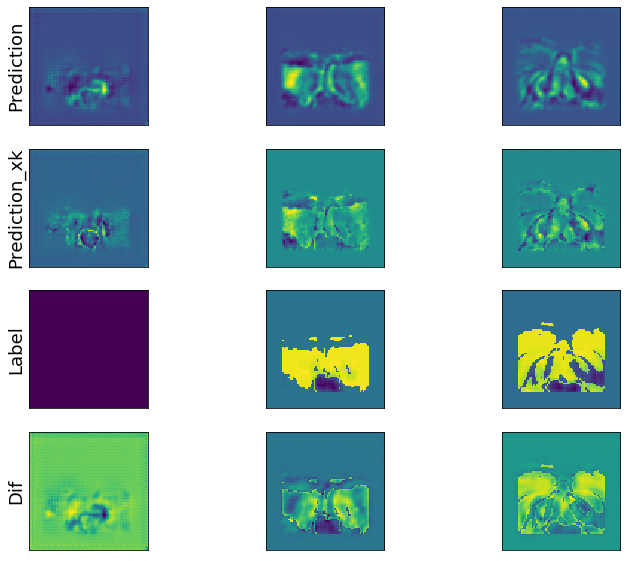

[Epoch 3/100] [Batch 36901/43600] [Model loss: 4.327542-0.857548-7.797537 ; nrmse: 0.855583]


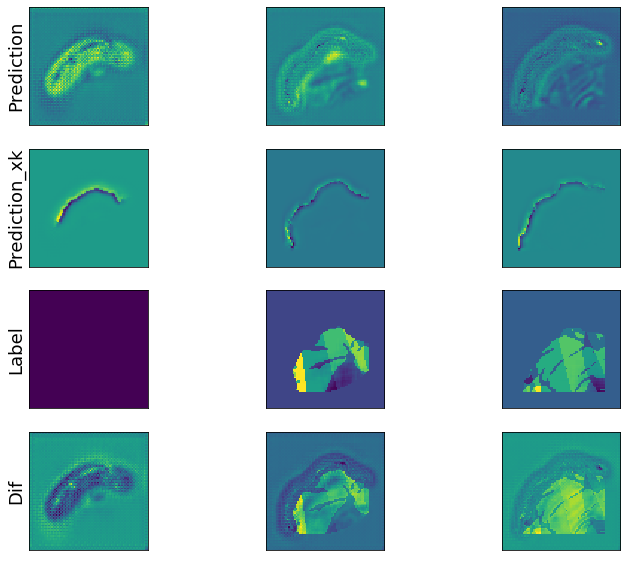

[Epoch 3/100] [Batch 37801/43600] [Model loss: 2.024122-0.835707-3.212538 ; nrmse: 0.835806]


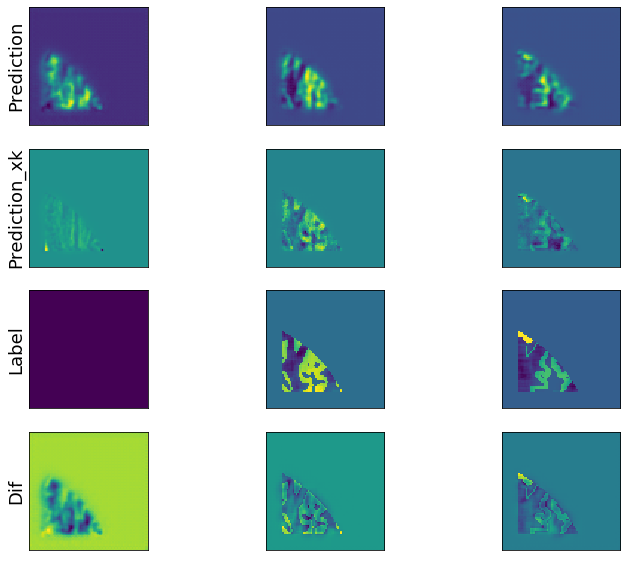

[Epoch 3/100] [Batch 38701/43600] [Model loss: 2.005423-0.796127-3.214719 ; nrmse: 0.796068]


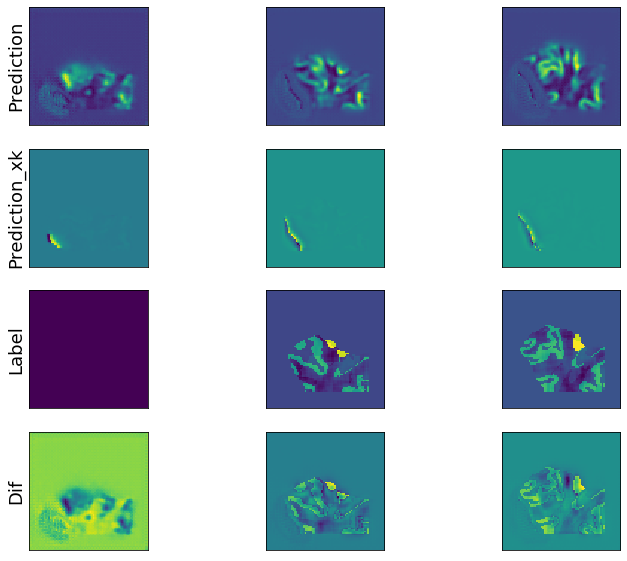

[Epoch 3/100] [Batch 39601/43600] [Model loss: 2.168227-0.839388-3.497066 ; nrmse: 0.836145]


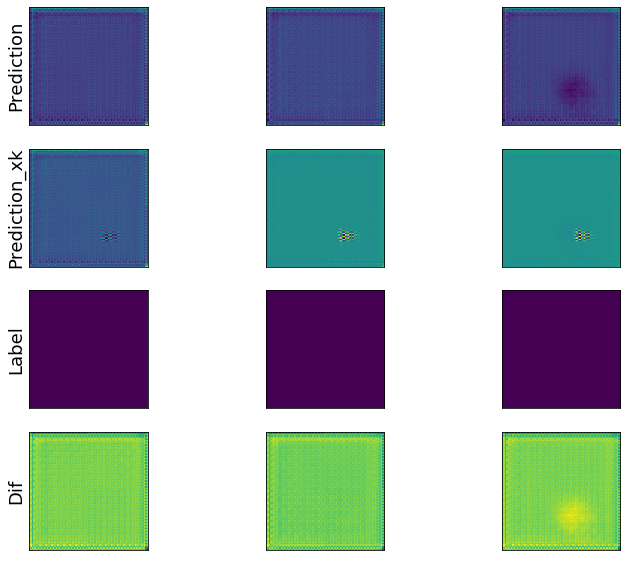

[Epoch 3/100] [Batch 40501/43600] [Model loss: 1.750662-0.984084-2.517239 ; nrmse: 0.970848]


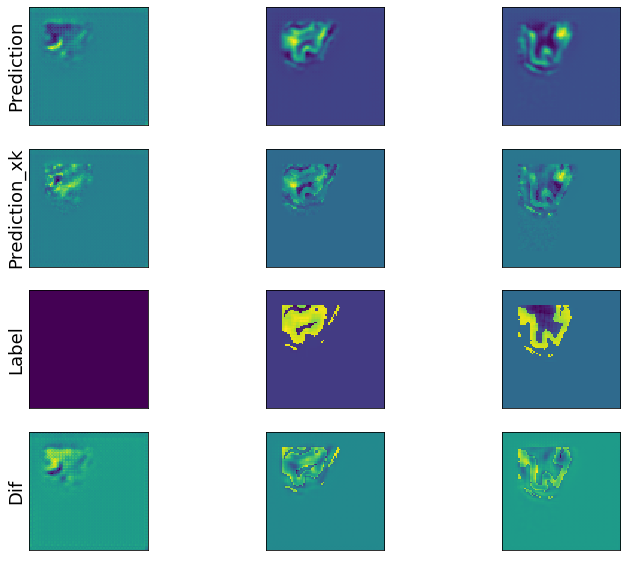

[Epoch 3/100] [Batch 41401/43600] [Model loss: 1.900416-0.882367-2.918465 ; nrmse: 0.882177]


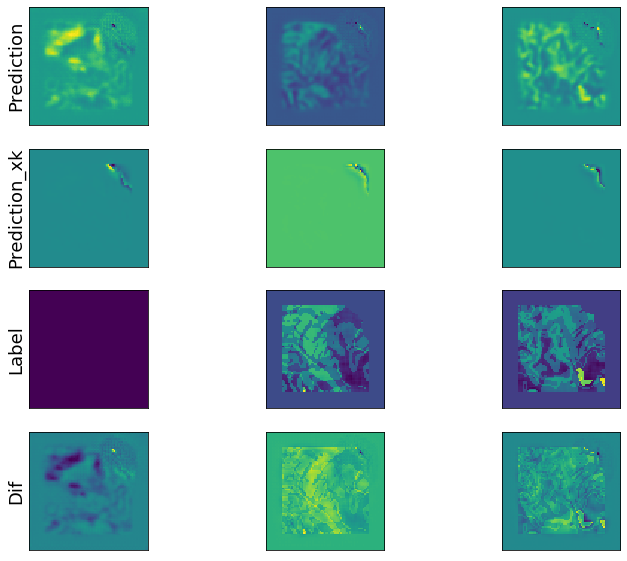

[Epoch 3/100] [Batch 42301/43600] [Model loss: 2.263738-0.773922-3.753553 ; nrmse: 0.770414]


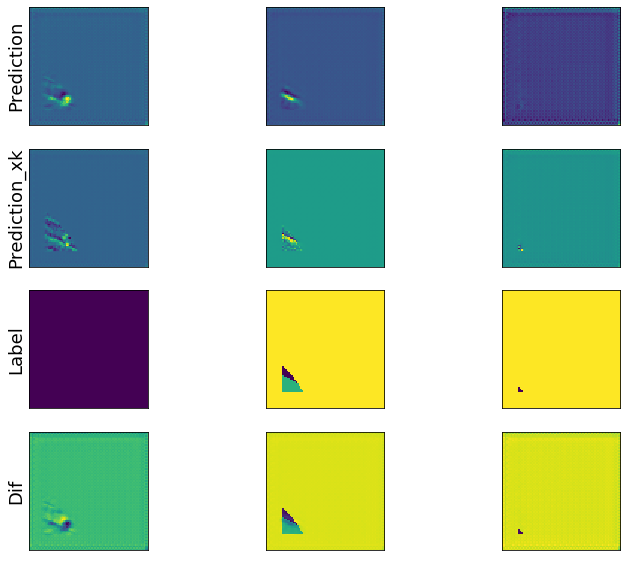

[Epoch 3/100] [Batch 43201/43600] [Model loss: 1.742175-0.778195-2.706156 ; nrmse: 0.776102]


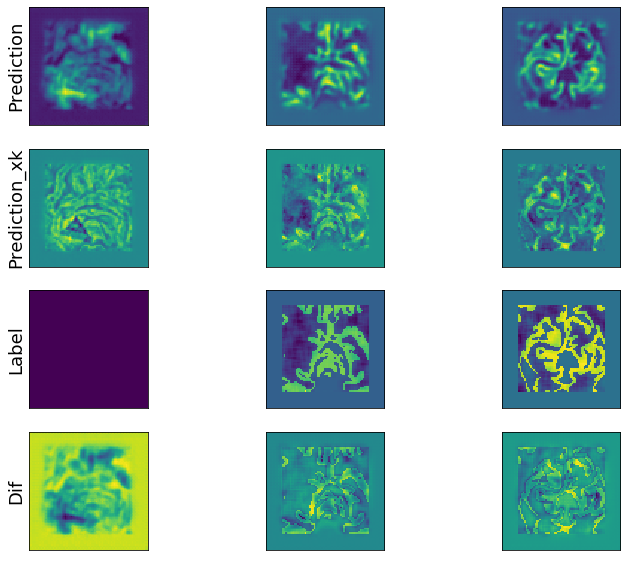

Epoch: 0003 Training_cost= 2.57491


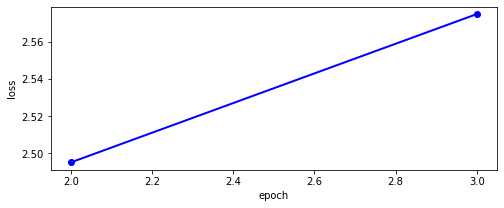

[Epoch 4/100] [Batch 1/43600] [Model loss: 9.018755-0.837250-17.200260 ; nrmse: 0.836477]


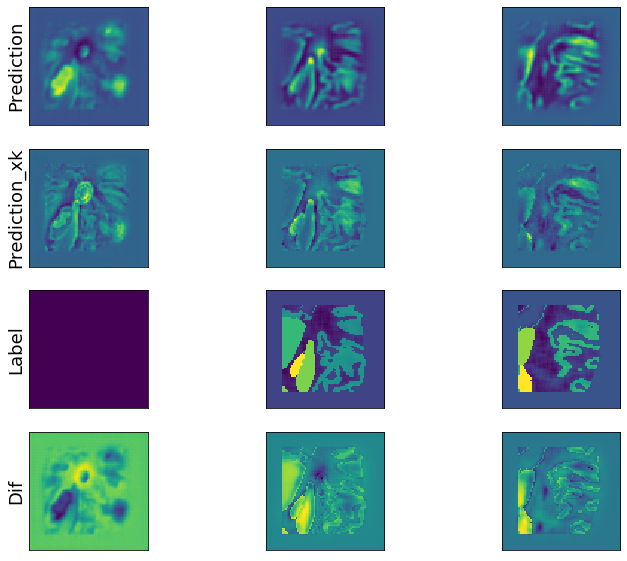

[Epoch 4/100] [Batch 901/43600] [Model loss: 1.295455-0.875060-1.715849 ; nrmse: 0.873800]


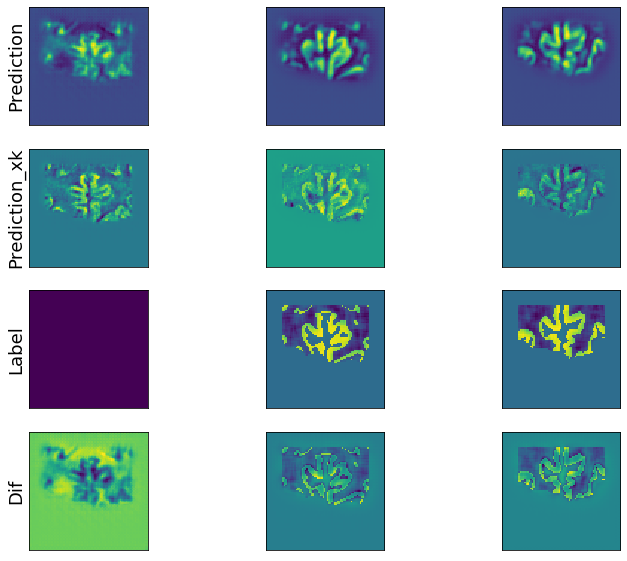

[Epoch 4/100] [Batch 1801/43600] [Model loss: 1.300728-0.887585-1.713872 ; nrmse: 0.884196]


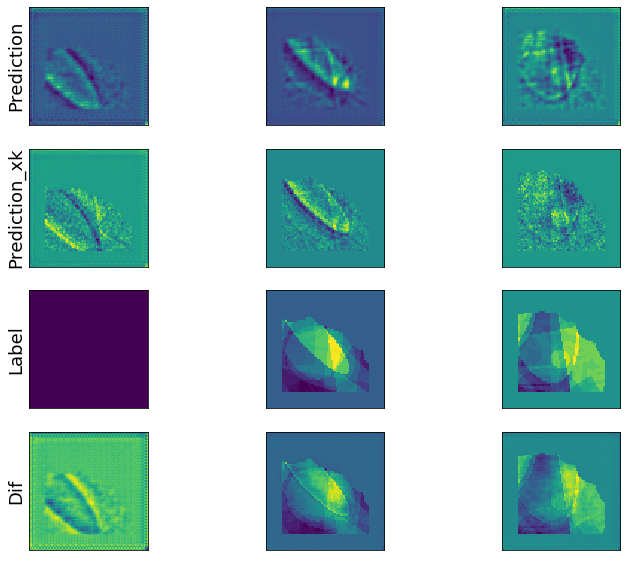

[Epoch 4/100] [Batch 2701/43600] [Model loss: 2.863568-0.878699-4.848437 ; nrmse: 0.878402]


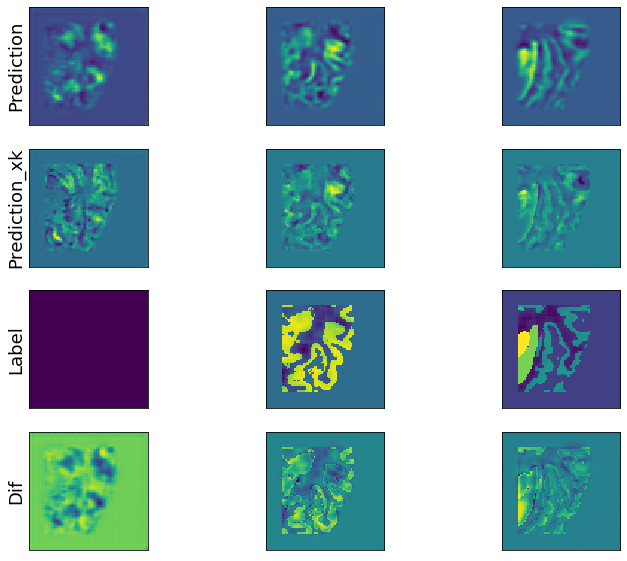

[Epoch 4/100] [Batch 3601/43600] [Model loss: 2.341316-0.814516-3.868117 ; nrmse: 0.813703]


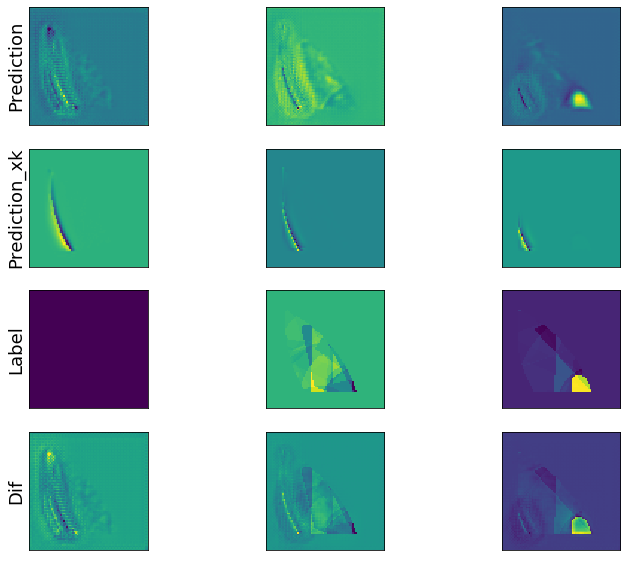

[Epoch 4/100] [Batch 4501/43600] [Model loss: 1.375517-0.846676-1.904359 ; nrmse: 0.846290]


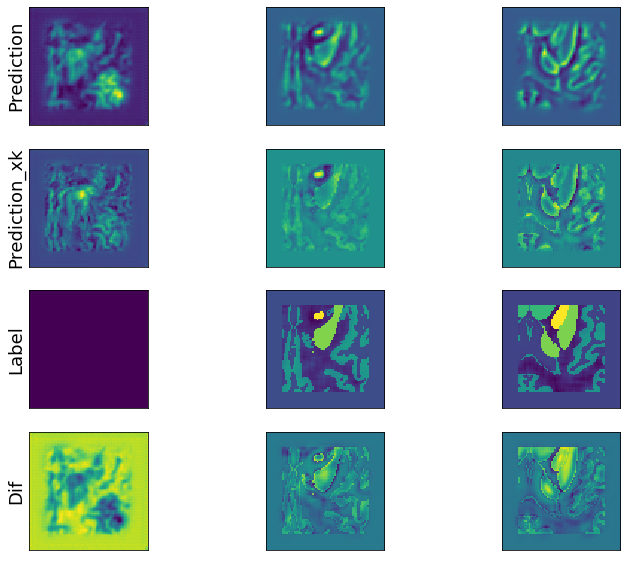

[Epoch 4/100] [Batch 5401/43600] [Model loss: 1.781314-0.791638-2.770989 ; nrmse: 0.790667]


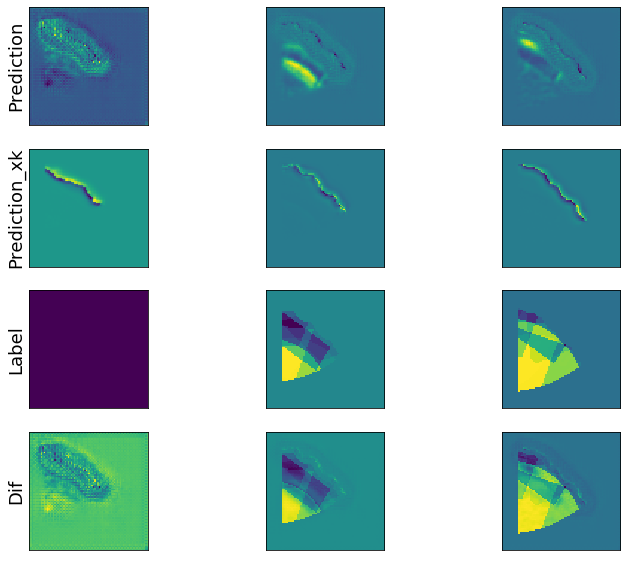

[Epoch 4/100] [Batch 6301/43600] [Model loss: 1.602742-0.811338-2.394145 ; nrmse: 0.811084]


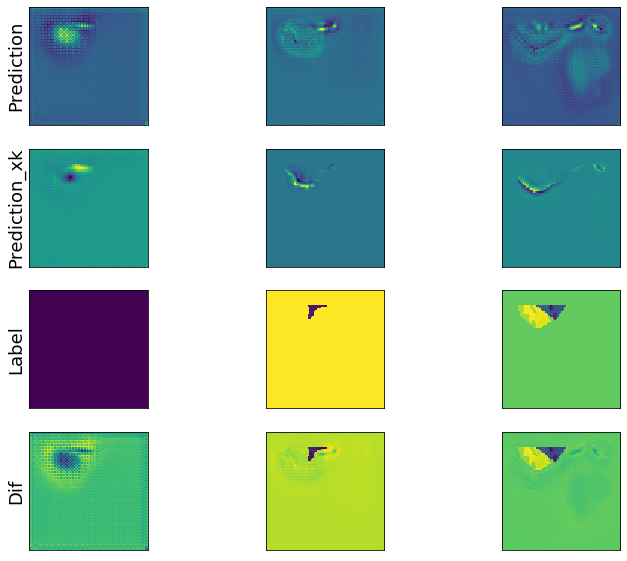

[Epoch 4/100] [Batch 7201/43600] [Model loss: 1.982721-0.876028-3.089414 ; nrmse: 0.875451]


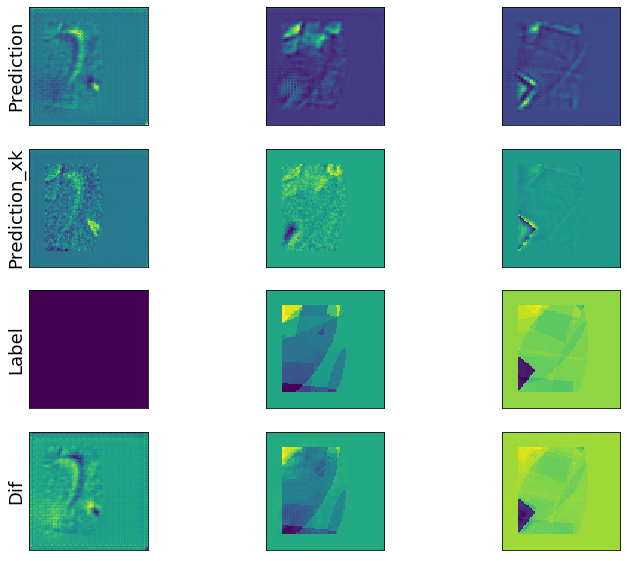

In [ ]:
# opt['train_data'].absolute_ind = 0
# opt['train_data'].shuffle_all()
# opt['val_data'].absolute_ind = 0
# opt['val_data'].shuffle_all()

nr_train_im = opt['train_data'].data_size
nr_im_per_epoch = int(np.ceil(nr_train_im / opt['batch_size']) * opt['batch_size'])

start_time = time.time()
print("Start Time:" + str(start_time))

avg_epoch_cost = []
print('-----Start Training-----')
for epoch in range(start_epoch, opt['model_total_epoch']):
 
    order = np.concatenate((np.random.permutation(nr_train_im),
                                         np.random.randint(nr_train_im, size=nr_im_per_epoch - nr_train_im)))
    avg_img_cost = []
    for block_i in range(1, nr_im_per_epoch+1, opt['batch_size']):
        index = order[block_i:block_i+opt['batch_size']]
        x1_train, x2_train, y_train = opt['train_data'].next(index, opt)

        # Training
        x_in = np.concatenate((x1_train, x2_train),axis=-1)

#         history = model['combine'].fit(x_in, [y_train,y_train] ,verbose = 0)
        history = model['combine'].train_on_batch(x_in, [y_train,y_train])
        [y_pred1, y_pred2] = model['combine'].predict(x_in)
        m_loss1 = history[0] #history.history['loss'][0]
        m_loss2 = history[1]#history.history['loss'][1]
        m_loss3 = history[2]#history.history['loss'][2]
        norm_loss = np.linalg.norm(y_pred1-y_train)/np.linalg.norm(y_train)
        avg_img_cost.append(m_loss1)
        if block_i % (30 * opt['batch_size'])==1:
            # Plot the progress
            print ("[Epoch %d/%d] [Batch %d/%d] [Model loss: %f-%f-%f ; nrmse: %f]" % (epoch, opt['model_total_epoch'],
                                                                block_i, nr_train_im,
                                                                m_loss1,m_loss2,m_loss3, norm_loss))
            display_slice(opt['display_nums'], y_pred1,y_pred2, y_train)
    avg_epoch_cost.append(np.mean(avg_img_cost)) 
                                
    print("Epoch:", '%04d' % (epoch), "Training_cost=", "{:.5f}".format(avg_epoch_cost[-1]))
    display_error(range(start_epoch,epoch+1),avg_epoch_cost)

    # If at save interval => save models
    if epoch % opt['model_save_interval'] == 0:
        model['vnet'].save_weights(opt['checkpoint_path'].format(epoch=epoch))
            
elapsed_time = time.time() - start_time
print("Total Time:" + str(elapsed_time))